In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3504.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3926.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3721.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3851.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3749.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3975.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3223.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3577.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3615.txt
/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/labels/3931.txt


In [2]:
# Git clone method (for development)
!git clone https://github.com/ultralytics/ultralytics
%pip install -e ultralytics

Cloning into 'ultralytics'...
remote: Enumerating objects: 55060, done.
remote: Counting objects: 100% (601/601), done.
remote: Compressing objects: 100% (343/343), done.
remote: Total 55060 (delta 441), reused 264 (delta 258), pack-reused 54459 (from 3)
Receiving objects: 100% (55060/55060), 31.06 MiB | 19.89 MiB/s, done.
Resolving deltas: 100% (40707/40707), done.
Obtaining file:///kaggle/working/ultralytics
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done
  Created wheel for ultralytics: filename=ultralytics-8.3.102-0.editable-py3-none-any.whl size=23140 sha256=fb7470be82a5ff073714e3c122080ca9d6a8069749328f61017ddb9b67692500
  Stored in directory: /tmp/pip-ephem-wheel-cache-e6x6nf77/wheels/1b/eb/7d/853f2df0532389050170c8cd117b40e1fef8d125854a910fe6
Successfully buil

In [3]:
!pip3 uninstall wandb -y

Found existing installation: wandb 0.19.1
Uninstalling wandb-0.19.1:
  Successfully uninstalled wandb-0.19.1


In [4]:
%%writefile /kaggle/working/ultralytics/ultralytics/data/loaders.py

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

import glob
import math
import os
import time
from dataclasses import dataclass
from pathlib import Path
from threading import Thread
from urllib.parse import urlparse

import cv2
import numpy as np
import requests
import torch
from PIL import Image

from ultralytics.data.utils import FORMATS_HELP_MSG, IMG_FORMATS, VID_FORMATS
from ultralytics.utils import IS_COLAB, IS_KAGGLE, LOGGER, ops
from ultralytics.utils.checks import check_requirements
from ultralytics.utils.patches import imread

change_colorspace = cv2.COLOR_BGR2HLS

@dataclass
class SourceTypes:
    """
    Class to represent various types of input sources for predictions.

    This class uses dataclass to define boolean flags for different types of input sources that can be used for
    making predictions with YOLO models.

    Attributes:
        stream (bool): Flag indicating if the input source is a video stream.
        screenshot (bool): Flag indicating if the input source is a screenshot.
        from_img (bool): Flag indicating if the input source is an image file.
        tensor (bool): Flag indicating if the input source is a tensor.

    Examples:
        >>> source_types = SourceTypes(stream=True, screenshot=False, from_img=False)
        >>> print(source_types.stream)
        True
        >>> print(source_types.from_img)
        False
    """

    stream: bool = False
    screenshot: bool = False
    from_img: bool = False
    tensor: bool = False


class LoadStreams:
    """
    Stream Loader for various types of video streams.

    Supports RTSP, RTMP, HTTP, and TCP streams. This class handles the loading and processing of multiple video
    streams simultaneously, making it suitable for real-time video analysis tasks.

    Attributes:
        sources (List[str]): The source input paths or URLs for the video streams.
        vid_stride (int): Video frame-rate stride.
        buffer (bool): Whether to buffer input streams.
        running (bool): Flag to indicate if the streaming thread is running.
        mode (str): Set to 'stream' indicating real-time capture.
        imgs (List[List[np.ndarray]]): List of image frames for each stream.
        fps (List[float]): List of FPS for each stream.
        frames (List[int]): List of total frames for each stream.
        threads (List[Thread]): List of threads for each stream.
        shape (List[Tuple[int, int, int]]): List of shapes for each stream.
        caps (List[cv2.VideoCapture]): List of cv2.VideoCapture objects for each stream.
        bs (int): Batch size for processing.

    Methods:
        update: Read stream frames in daemon thread.
        close: Close stream loader and release resources.
        __iter__: Returns an iterator object for the class.
        __next__: Returns source paths, transformed, and original images for processing.
        __len__: Return the length of the sources object.

    Examples:
        >>> stream_loader = LoadStreams("rtsp://example.com/stream1.mp4")
        >>> for sources, imgs, _ in stream_loader:
        ...     # Process the images
        ...     pass
        >>> stream_loader.close()

    Notes:
        - The class uses threading to efficiently load frames from multiple streams simultaneously.
        - It automatically handles YouTube links, converting them to the best available stream URL.
        - The class implements a buffer system to manage frame storage and retrieval.
    """

    def __init__(self, sources="file.streams", vid_stride=1, buffer=False):
        """Initialize stream loader for multiple video sources, supporting various stream types."""
        torch.backends.cudnn.benchmark = True  # faster for fixed-size inference
        self.buffer = buffer  # buffer input streams
        self.running = True  # running flag for Thread
        self.mode = "stream"
        self.vid_stride = vid_stride  # video frame-rate stride

        sources = Path(sources).read_text().rsplit() if os.path.isfile(sources) else [sources]
        n = len(sources)
        self.bs = n
        self.fps = [0] * n  # frames per second
        self.frames = [0] * n
        self.threads = [None] * n
        self.caps = [None] * n  # video capture objects
        self.imgs = [[] for _ in range(n)]  # images
        self.shape = [[] for _ in range(n)]  # image shapes
        self.sources = [ops.clean_str(x).replace(os.sep, "_") for x in sources]  # clean source names for later
        for i, s in enumerate(sources):  # index, source
            # Start thread to read frames from video stream
            st = f"{i + 1}/{n}: {s}... "
            if urlparse(s).hostname in {"www.youtube.com", "youtube.com", "youtu.be"}:  # if source is YouTube video
                # YouTube format i.e. 'https://www.youtube.com/watch?v=Jsn8D3aC840' or 'https://youtu.be/Jsn8D3aC840'
                s = get_best_youtube_url(s)
            s = eval(s) if s.isnumeric() else s  # i.e. s = '0' local webcam
            if s == 0 and (IS_COLAB or IS_KAGGLE):
                raise NotImplementedError(
                    "'source=0' webcam not supported in Colab and Kaggle notebooks. "
                    "Try running 'source=0' in a local environment."
                )
            self.caps[i] = cv2.VideoCapture(s)  # store video capture object
            if not self.caps[i].isOpened():
                raise ConnectionError(f"{st}Failed to open {s}")
            w = int(self.caps[i].get(cv2.CAP_PROP_FRAME_WIDTH))
            h = int(self.caps[i].get(cv2.CAP_PROP_FRAME_HEIGHT))
            fps = self.caps[i].get(cv2.CAP_PROP_FPS)  # warning: may return 0 or nan
            self.frames[i] = max(int(self.caps[i].get(cv2.CAP_PROP_FRAME_COUNT)), 0) or float(
                "inf"
            )  # infinite stream fallback
            self.fps[i] = max((fps if math.isfinite(fps) else 0) % 100, 0) or 30  # 30 FPS fallback

            success, im = self.caps[i].read()  # guarantee first frame
            if not success or im is None:
                raise ConnectionError(f"{st}Failed to read images from {s}")
            self.imgs[i].append(im)
            self.shape[i] = im.shape
            self.threads[i] = Thread(target=self.update, args=([i, self.caps[i], s]), daemon=True)
            LOGGER.info(f"{st}Success ✅ ({self.frames[i]} frames of shape {w}x{h} at {self.fps[i]:.2f} FPS)")
            self.threads[i].start()
        LOGGER.info("")  # newline

    def update(self, i, cap, stream):
        """Read stream frames in daemon thread and update image buffer."""
        n, f = 0, self.frames[i]  # frame number, frame array
        while self.running and cap.isOpened() and n < (f - 1):
            if len(self.imgs[i]) < 30:  # keep a <=30-image buffer
                n += 1
                cap.grab()  # .read() = .grab() followed by .retrieve()
                if n % self.vid_stride == 0:
                    success, im = cap.retrieve()
                    if not success:
                        im = np.zeros(self.shape[i], dtype=np.uint8)
                        LOGGER.warning("WARNING ⚠️ Video stream unresponsive, please check your IP camera connection.")
                        cap.open(stream)  # re-open stream if signal was lost
                    if self.buffer:
                        self.imgs[i].append(im)
                    else:
                        self.imgs[i] = [im]
            else:
                time.sleep(0.01)  # wait until the buffer is empty

    def close(self):
        """Terminates stream loader, stops threads, and releases video capture resources."""
        self.running = False  # stop flag for Thread
        for thread in self.threads:
            if thread.is_alive():
                thread.join(timeout=5)  # Add timeout
        for cap in self.caps:  # Iterate through the stored VideoCapture objects
            try:
                cap.release()  # release video capture
            except Exception as e:
                LOGGER.warning(f"WARNING ⚠️ Could not release VideoCapture object: {e}")
        cv2.destroyAllWindows()

    def __iter__(self):
        """Iterates through YOLO image feed and re-opens unresponsive streams."""
        self.count = -1
        return self

    def __next__(self):
        """Returns the next batch of frames from multiple video streams for processing."""
        self.count += 1

        images = []
        for i, x in enumerate(self.imgs):
            # Wait until a frame is available in each buffer
            while not x:
                if not self.threads[i].is_alive() or cv2.waitKey(1) == ord("q"):  # q to quit
                    self.close()
                    raise StopIteration
                time.sleep(1 / min(self.fps))
                x = self.imgs[i]
                if not x:
                    LOGGER.warning(f"WARNING ⚠️ Waiting for stream {i}")

            # Get and remove the first frame from imgs buffer
            if self.buffer:
                images.append(x.pop(0))

            # Get the last frame, and clear the rest from the imgs buffer
            else:
                images.append(x.pop(-1) if x else np.zeros(self.shape[i], dtype=np.uint8))
                x.clear()

        return self.sources, images, [""] * self.bs

    def __len__(self):
        """Return the number of video streams in the LoadStreams object."""
        return self.bs  # 1E12 frames = 32 streams at 30 FPS for 30 years


class LoadScreenshots:
    """
    Ultralytics screenshot dataloader for capturing and processing screen images.

    This class manages the loading of screenshot images for processing with YOLO. It is suitable for use with
    `yolo predict source=screen`.

    Attributes:
        source (str): The source input indicating which screen to capture.
        screen (int): The screen number to capture.
        left (int): The left coordinate for screen capture area.
        top (int): The top coordinate for screen capture area.
        width (int): The width of the screen capture area.
        height (int): The height of the screen capture area.
        mode (str): Set to 'stream' indicating real-time capture.
        frame (int): Counter for captured frames.
        sct (mss.mss): Screen capture object from `mss` library.
        bs (int): Batch size, set to 1.
        fps (int): Frames per second, set to 30.
        monitor (Dict[str, int]): Monitor configuration details.

    Methods:
        __iter__: Returns an iterator object.
        __next__: Captures the next screenshot and returns it.

    Examples:
        >>> loader = LoadScreenshots("0 100 100 640 480")  # screen 0, top-left (100,100), 640x480
        >>> for source, im, im0s, vid_cap, s in loader:
        ...     print(f"Captured frame: {im.shape}")
    """

    def __init__(self, source):
        """Initialize screenshot capture with specified screen and region parameters."""
        check_requirements("mss")
        import mss  # noqa

        source, *params = source.split()
        self.screen, left, top, width, height = 0, None, None, None, None  # default to full screen 0
        if len(params) == 1:
            self.screen = int(params[0])
        elif len(params) == 4:
            left, top, width, height = (int(x) for x in params)
        elif len(params) == 5:
            self.screen, left, top, width, height = (int(x) for x in params)
        self.mode = "stream"
        self.frame = 0
        self.sct = mss.mss()
        self.bs = 1
        self.fps = 30

        # Parse monitor shape
        monitor = self.sct.monitors[self.screen]
        self.top = monitor["top"] if top is None else (monitor["top"] + top)
        self.left = monitor["left"] if left is None else (monitor["left"] + left)
        self.width = width or monitor["width"]
        self.height = height or monitor["height"]
        self.monitor = {"left": self.left, "top": self.top, "width": self.width, "height": self.height}

    def __iter__(self):
        """Yields the next screenshot image from the specified screen or region for processing."""
        return self

    def __next__(self):
        """Captures and returns the next screenshot as a numpy array using the mss library."""
        im0 = np.asarray(self.sct.grab(self.monitor))[:, :, :3]  # BGRA to BGR
        s = f"screen {self.screen} (LTWH): {self.left},{self.top},{self.width},{self.height}: "

        self.frame += 1
        return [str(self.screen)], [im0], [s]  # screen, img, string


class LoadImagesAndVideos:
    """
    A class for loading and processing images and videos for YOLO object detection.

    This class manages the loading and pre-processing of image and video data from various sources, including
    single image files, video files, and lists of image and video paths.

    Attributes:
        files (List[str]): List of image and video file paths.
        nf (int): Total number of files (images and videos).
        video_flag (List[bool]): Flags indicating whether a file is a video (True) or an image (False).
        mode (str): Current mode, 'image' or 'video'.
        vid_stride (int): Stride for video frame-rate.
        bs (int): Batch size.
        cap (cv2.VideoCapture): Video capture object for OpenCV.
        frame (int): Frame counter for video.
        frames (int): Total number of frames in the video.
        count (int): Counter for iteration, initialized at 0 during __iter__().
        ni (int): Number of images.

    Methods:
        __init__: Initialize the LoadImagesAndVideos object.
        __iter__: Returns an iterator object for VideoStream or ImageFolder.
        __next__: Returns the next batch of images or video frames along with their paths and metadata.
        _new_video: Creates a new video capture object for the given path.
        __len__: Returns the number of batches in the object.

    Examples:
        >>> loader = LoadImagesAndVideos("path/to/data", batch=32, vid_stride=1)
        >>> for paths, imgs, info in loader:
        ...     # Process batch of images or video frames
        ...     pass

    Notes:
        - Supports various image formats including HEIC.
        - Handles both local files and directories.
        - Can read from a text file containing paths to images and videos.
    """

    def __init__(self, path, batch=1, vid_stride=1):
        """Initialize dataloader for images and videos, supporting various input formats."""
        parent = None
        if isinstance(path, str) and Path(path).suffix == ".txt":  # *.txt file with img/vid/dir on each line
            parent = Path(path).parent
            path = Path(path).read_text().splitlines()  # list of sources
        files = []
        for p in sorted(path) if isinstance(path, (list, tuple)) else [path]:
            a = str(Path(p).absolute())  # do not use .resolve() https://github.com/ultralytics/ultralytics/issues/2912
            if "*" in a:
                files.extend(sorted(glob.glob(a, recursive=True)))  # glob
            elif os.path.isdir(a):
                files.extend(sorted(glob.glob(os.path.join(a, "*.*"))))  # dir
            elif os.path.isfile(a):
                files.append(a)  # files (absolute or relative to CWD)
            elif parent and (parent / p).is_file():
                files.append(str((parent / p).absolute()))  # files (relative to *.txt file parent)
            else:
                raise FileNotFoundError(f"{p} does not exist")

        # Define files as images or videos
        images, videos = [], []
        for f in files:
            suffix = f.split(".")[-1].lower()  # Get file extension without the dot and lowercase
            if suffix in IMG_FORMATS:
                images.append(f)
            elif suffix in VID_FORMATS:
                videos.append(f)
        ni, nv = len(images), len(videos)

        self.files = images + videos
        self.nf = ni + nv  # number of files
        self.ni = ni  # number of images
        self.video_flag = [False] * ni + [True] * nv
        self.mode = "video" if ni == 0 else "image"  # default to video if no images
        self.vid_stride = vid_stride  # video frame-rate stride
        self.bs = batch
        if any(videos):
            self._new_video(videos[0])  # new video
        else:
            self.cap = None
        if self.nf == 0:
            raise FileNotFoundError(f"No images or videos found in {p}. {FORMATS_HELP_MSG}")

    def __iter__(self):
        """Iterates through image/video files, yielding source paths, images, and metadata."""
        self.count = 0
        return self

    def __next__(self):
        """Returns the next batch of images or video frames with their paths and metadata."""
        paths, imgs, info = [], [], []
        while len(imgs) < self.bs:
            if self.count >= self.nf:  # end of file list
                if imgs:
                    return paths, imgs, info  # return last partial batch
                else:
                    raise StopIteration

            path = self.files[self.count]
            if self.video_flag[self.count]:
                self.mode = "video"
                if not self.cap or not self.cap.isOpened():
                    self._new_video(path)

                success = False
                for _ in range(self.vid_stride):
                    success = self.cap.grab()
                    if not success:
                        break  # end of video or failure

                if success:
                    success, im0 = self.cap.retrieve()
                    if success:
                        self.frame += 1
                        paths.append(path)
                        imgs.append(im0)
                        info.append(f"video {self.count + 1}/{self.nf} (frame {self.frame}/{self.frames}) {path}: ")
                        if self.frame == self.frames:  # end of video
                            self.count += 1
                            self.cap.release()
                else:
                    # Move to the next file if the current video ended or failed to open
                    self.count += 1
                    if self.cap:
                        self.cap.release()
                    if self.count < self.nf:
                        self._new_video(self.files[self.count])
            else:
                # Handle image files (including HEIC)
                self.mode = "image"
                if path.split(".")[-1].lower() == "heic":
                    # Load HEIC image using Pillow with pillow-heif
                    check_requirements("pillow-heif")

                    from pillow_heif import register_heif_opener

                    register_heif_opener()  # Register HEIF opener with Pillow
                    with Image.open(path) as img:
                        im0 = cv2.cvtColor(np.asarray(img), cv2.COLOR_RGB2BGR)  # convert image to BGR nparray
                        im0 = cv2.cvtColor(im0, change_colorspace)
                else:
                    im0 = imread(path)  # BGR
                    im0 = cv2.cvtColor(im0, change_colorspace)
                if im0 is None:
                    LOGGER.warning(f"WARNING ⚠️ Image Read Error {path}")
                else:
                    paths.append(path)
                    imgs.append(im0)
                    info.append(f"image {self.count + 1}/{self.nf} {path}: ")
                self.count += 1  # move to the next file
                if self.count >= self.ni:  # end of image list
                    break

        return paths, imgs, info

    def _new_video(self, path):
        """Creates a new video capture object for the given path and initializes video-related attributes."""
        self.frame = 0
        self.cap = cv2.VideoCapture(path)
        self.fps = int(self.cap.get(cv2.CAP_PROP_FPS))
        if not self.cap.isOpened():
            raise FileNotFoundError(f"Failed to open video {path}")
        self.frames = int(self.cap.get(cv2.CAP_PROP_FRAME_COUNT) / self.vid_stride)

    def __len__(self):
        """Returns the number of files (images and videos) in the dataset."""
        return math.ceil(self.nf / self.bs)  # number of batches


class LoadPilAndNumpy:
    """
    Load images from PIL and Numpy arrays for batch processing.

    This class manages loading and pre-processing of image data from both PIL and Numpy formats. It performs basic
    validation and format conversion to ensure that the images are in the required format for downstream processing.

    Attributes:
        paths (List[str]): List of image paths or autogenerated filenames.
        im0 (List[np.ndarray]): List of images stored as Numpy arrays.
        mode (str): Type of data being processed, set to 'image'.
        bs (int): Batch size, equivalent to the length of `im0`.

    Methods:
        _single_check: Validate and format a single image to a Numpy array.

    Examples:
        >>> from PIL import Image
        >>> import numpy as np
        >>> pil_img = Image.new("RGB", (100, 100))
        >>> np_img = np.random.randint(0, 255, (100, 100, 3), dtype=np.uint8)
        >>> loader = LoadPilAndNumpy([pil_img, np_img])
        >>> paths, images, _ = next(iter(loader))
        >>> print(f"Loaded {len(images)} images")
        Loaded 2 images
    """

    def __init__(self, im0):
        """Initializes a loader for PIL and Numpy images, converting inputs to a standardized format."""
        if not isinstance(im0, list):
            im0 = [im0]
        # use `image{i}.jpg` when Image.filename returns an empty path.
        self.paths = [getattr(im, "filename", "") or f"image{i}.jpg" for i, im in enumerate(im0)]
        self.im0 = [self._single_check(im) for im in im0]
        self.mode = "image"
        self.bs = len(self.im0)

    @staticmethod
    def _single_check(im):
        """Validate and format an image to numpy array, ensuring RGB order and contiguous memory."""
        assert isinstance(im, (Image.Image, np.ndarray)), f"Expected PIL/np.ndarray image type, but got {type(im)}"
        if isinstance(im, Image.Image):
            if im.mode != "RGB":
                im = im.convert("RGB")
            im = np.asarray(im)[:, :, ::-1]
            im = np.ascontiguousarray(im)  # contiguous
        return im

    def __len__(self):
        """Returns the length of the 'im0' attribute, representing the number of loaded images."""
        return len(self.im0)

    def __next__(self):
        """Returns the next batch of images, paths, and metadata for processing."""
        if self.count == 1:  # loop only once as it's batch inference
            raise StopIteration
        self.count += 1
        return self.paths, self.im0, [""] * self.bs

    def __iter__(self):
        """Iterates through PIL/numpy images, yielding paths, raw images, and metadata for processing."""
        self.count = 0
        return self


class LoadTensor:
    """
    A class for loading and processing tensor data for object detection tasks.

    This class handles the loading and pre-processing of image data from PyTorch tensors, preparing them for
    further processing in object detection pipelines.

    Attributes:
        im0 (torch.Tensor): The input tensor containing the image(s) with shape (B, C, H, W).
        bs (int): Batch size, inferred from the shape of `im0`.
        mode (str): Current processing mode, set to 'image'.
        paths (List[str]): List of image paths or auto-generated filenames.

    Methods:
        _single_check: Validates and formats an input tensor.

    Examples:
        >>> import torch
        >>> tensor = torch.rand(1, 3, 640, 640)
        >>> loader = LoadTensor(tensor)
        >>> paths, images, info = next(iter(loader))
        >>> print(f"Processed {len(images)} images")
    """

    def __init__(self, im0) -> None:
        """Initialize LoadTensor object for processing torch.Tensor image data."""
        self.im0 = self._single_check(im0)
        self.bs = self.im0.shape[0]
        self.mode = "image"
        self.paths = [getattr(im, "filename", f"image{i}.jpg") for i, im in enumerate(im0)]

    @staticmethod
    def _single_check(im, stride=32):
        """Validates and formats a single image tensor, ensuring correct shape and normalization."""
        s = (
            f"WARNING ⚠️ torch.Tensor inputs should be BCHW i.e. shape(1, 3, 640, 640) "
            f"divisible by stride {stride}. Input shape{tuple(im.shape)} is incompatible."
        )
        if len(im.shape) != 4:
            if len(im.shape) != 3:
                raise ValueError(s)
            LOGGER.warning(s)
            im = im.unsqueeze(0)
        if im.shape[2] % stride or im.shape[3] % stride:
            raise ValueError(s)
        if im.max() > 1.0 + torch.finfo(im.dtype).eps:  # torch.float32 eps is 1.2e-07
            LOGGER.warning(
                f"WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is {im.max()}. "
                f"Dividing input by 255."
            )
            im = im.float() / 255.0

        return im

    def __iter__(self):
        """Yields an iterator object for iterating through tensor image data."""
        self.count = 0
        return self

    def __next__(self):
        """Yields the next batch of tensor images and metadata for processing."""
        if self.count == 1:
            raise StopIteration
        self.count += 1
        return self.paths, self.im0, [""] * self.bs

    def __len__(self):
        """Returns the batch size of the tensor input."""
        return self.bs


def autocast_list(source):
    """Merges a list of sources into a list of numpy arrays or PIL images for Ultralytics prediction."""
    files = []
    for im in source:
        if isinstance(im, (str, Path)):  # filename or uri
            files.append(Image.open(requests.get(im, stream=True).raw if str(im).startswith("http") else im))
        elif isinstance(im, (Image.Image, np.ndarray)):  # PIL or np Image
            files.append(im)
        else:
            raise TypeError(
                f"type {type(im).__name__} is not a supported Ultralytics prediction source type. \n"
                f"See https://docs.ultralytics.com/modes/predict for supported source types."
            )

    return files


def get_best_youtube_url(url, method="pytube"):
    """
    Retrieves the URL of the best quality MP4 video stream from a given YouTube video.

    Args:
        url (str): The URL of the YouTube video.
        method (str): The method to use for extracting video info. Options are "pytube", "pafy", and "yt-dlp".
            Defaults to "pytube".

    Returns:
        (str | None): The URL of the best quality MP4 video stream, or None if no suitable stream is found.

    Examples:
        >>> url = "https://www.youtube.com/watch?v=dQw4w9WgXcQ"
        >>> best_url = get_best_youtube_url(url)
        >>> print(best_url)
        https://rr4---sn-q4flrnek.googlevideo.com/videoplayback?expire=...

    Notes:
        - Requires additional libraries based on the chosen method: pytubefix, pafy, or yt-dlp.
        - The function prioritizes streams with at least 1080p resolution when available.
        - For the "yt-dlp" method, it looks for formats with video codec, no audio, and *.mp4 extension.
    """
    if method == "pytube":
        # Switched from pytube to pytubefix to resolve https://github.com/pytube/pytube/issues/1954
        check_requirements("pytubefix>=6.5.2")
        from pytubefix import YouTube

        streams = YouTube(url).streams.filter(file_extension="mp4", only_video=True)
        streams = sorted(streams, key=lambda s: s.resolution, reverse=True)  # sort streams by resolution
        for stream in streams:
            if stream.resolution and int(stream.resolution[:-1]) >= 1080:  # check if resolution is at least 1080p
                return stream.url

    elif method == "pafy":
        check_requirements(("pafy", "youtube_dl==2020.12.2"))
        import pafy  # noqa

        return pafy.new(url).getbestvideo(preftype="mp4").url

    elif method == "yt-dlp":
        check_requirements("yt-dlp")
        import yt_dlp

        with yt_dlp.YoutubeDL({"quiet": True}) as ydl:
            info_dict = ydl.extract_info(url, download=False)  # extract info
        for f in reversed(info_dict.get("formats", [])):  # reversed because best is usually last
            # Find a format with video codec, no audio, *.mp4 extension at least 1920x1080 size
            good_size = (f.get("width") or 0) >= 1920 or (f.get("height") or 0) >= 1080
            if good_size and f["vcodec"] != "none" and f["acodec"] == "none" and f["ext"] == "mp4":
                return f.get("url")


# Define constants
LOADERS = (LoadStreams, LoadPilAndNumpy, LoadImagesAndVideos, LoadScreenshots)

Overwriting /kaggle/working/ultralytics/ultralytics/data/loaders.py


In [5]:
%%writefile /kaggle/working/ultralytics/ultralytics/data/dataset.py

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

import json
from collections import defaultdict
from itertools import repeat
from multiprocessing.pool import ThreadPool
from pathlib import Path

import cv2
import numpy as np
import torch
from PIL import Image
from torch.utils.data import ConcatDataset

from ultralytics.utils import LOCAL_RANK, NUM_THREADS, TQDM, colorstr
from ultralytics.utils.ops import resample_segments
from ultralytics.utils.torch_utils import TORCHVISION_0_18

from .augment import (
    Compose,
    Format,
    Instances,
    LetterBox,
    RandomLoadText,
    classify_augmentations,
    classify_transforms,
    v8_transforms,
)
from .base import BaseDataset
from .utils import (
    HELP_URL,
    LOGGER,
    get_hash,
    img2label_paths,
    load_dataset_cache_file,
    save_dataset_cache_file,
    verify_image,
    verify_image_label,
)

change_colorspace = cv2.COLOR_BGR2HLS

# Ultralytics dataset *.cache version, >= 1.0.0 for YOLOv8
DATASET_CACHE_VERSION = "1.0.3"


class YOLODataset(BaseDataset):
    """
    Dataset class for loading object detection and/or segmentation labels in YOLO format.

    This class supports loading data for object detection, segmentation, pose estimation, and oriented bounding box
    (OBB) tasks using the YOLO format.

    Attributes:
        use_segments (bool): Indicates if segmentation masks should be used.
        use_keypoints (bool): Indicates if keypoints should be used for pose estimation.
        use_obb (bool): Indicates if oriented bounding boxes should be used.
        data (dict): Dataset configuration dictionary.

    Methods:
        cache_labels: Cache dataset labels, check images and read shapes.
        get_labels: Returns dictionary of labels for YOLO training.
        build_transforms: Builds and appends transforms to the list.
        close_mosaic: Sets mosaic, copy_paste and mixup options to 0.0 and builds transformations.
        update_labels_info: Updates label format for different tasks.
        collate_fn: Collates data samples into batches.

    Examples:
        >>> dataset = YOLODataset(img_path="path/to/images", data={"names": {0: "person"}}, task="detect")
        >>> dataset.get_labels()
    """

    def __init__(self, *args, data=None, task="detect", **kwargs):
        """
        Initialize the YOLODataset.

        Args:
            data (dict, optional): Dataset configuration dictionary.
            task (str): Task type, one of 'detect', 'segment', 'pose', or 'obb'.
            *args (Any): Additional positional arguments for the parent class.
            **kwargs (Any): Additional keyword arguments for the parent class.
        """
        self.use_segments = task == "segment"
        self.use_keypoints = task == "pose"
        self.use_obb = task == "obb"
        self.data = data
        assert not (self.use_segments and self.use_keypoints), "Can not use both segments and keypoints."
        super().__init__(*args, **kwargs)

    def cache_labels(self, path=Path("./labels.cache")):
        """
        Cache dataset labels, check images and read shapes.

        Args:
            path (Path): Path where to save the cache file.

        Returns:
            (dict): Dictionary containing cached labels and related information.
        """
        x = {"labels": []}
        nm, nf, ne, nc, msgs = 0, 0, 0, 0, []  # number missing, found, empty, corrupt, messages
        desc = f"{self.prefix}Scanning {path.parent / path.stem}..."
        total = len(self.im_files)
        nkpt, ndim = self.data.get("kpt_shape", (0, 0))
        if self.use_keypoints and (nkpt <= 0 or ndim not in {2, 3}):
            raise ValueError(
                "'kpt_shape' in data.yaml missing or incorrect. Should be a list with [number of "
                "keypoints, number of dims (2 for x,y or 3 for x,y,visible)], i.e. 'kpt_shape: [17, 3]'"
            )
        with ThreadPool(NUM_THREADS) as pool:
            results = pool.imap(
                func=verify_image_label,
                iterable=zip(
                    self.im_files,
                    self.label_files,
                    repeat(self.prefix),
                    repeat(self.use_keypoints),
                    repeat(len(self.data["names"])),
                    repeat(nkpt),
                    repeat(ndim),
                    repeat(self.single_cls),
                ),
            )
            pbar = TQDM(results, desc=desc, total=total)
            for im_file, lb, shape, segments, keypoint, nm_f, nf_f, ne_f, nc_f, msg in pbar:
                nm += nm_f
                nf += nf_f
                ne += ne_f
                nc += nc_f
                if im_file:
                    x["labels"].append(
                        {
                            "im_file": im_file,
                            "shape": shape,
                            "cls": lb[:, 0:1],  # n, 1
                            "bboxes": lb[:, 1:],  # n, 4
                            "segments": segments,
                            "keypoints": keypoint,
                            "normalized": True,
                            "bbox_format": "xywh",
                        }
                    )
                if msg:
                    msgs.append(msg)
                pbar.desc = f"{desc} {nf} images, {nm + ne} backgrounds, {nc} corrupt"
            pbar.close()

        if msgs:
            LOGGER.info("\n".join(msgs))
        if nf == 0:
            LOGGER.warning(f"{self.prefix}WARNING ⚠️ No labels found in {path}. {HELP_URL}")
        x["hash"] = get_hash(self.label_files + self.im_files)
        x["results"] = nf, nm, ne, nc, len(self.im_files)
        x["msgs"] = msgs  # warnings
        save_dataset_cache_file(self.prefix, path, x, DATASET_CACHE_VERSION)
        return x

    def get_labels(self):
        """
        Returns dictionary of labels for YOLO training.

        This method loads labels from disk or cache, verifies their integrity, and prepares them for training.

        Returns:
            (List[dict]): List of label dictionaries, each containing information about an image and its annotations.
        """
        self.label_files = img2label_paths(self.im_files)
        cache_path = Path(self.label_files[0]).parent.with_suffix(".cache")
        try:
            cache, exists = load_dataset_cache_file(cache_path), True  # attempt to load a *.cache file
            assert cache["version"] == DATASET_CACHE_VERSION  # matches current version
            assert cache["hash"] == get_hash(self.label_files + self.im_files)  # identical hash
        except (FileNotFoundError, AssertionError, AttributeError):
            cache, exists = self.cache_labels(cache_path), False  # run cache ops

        # Display cache
        nf, nm, ne, nc, n = cache.pop("results")  # found, missing, empty, corrupt, total
        if exists and LOCAL_RANK in {-1, 0}:
            d = f"Scanning {cache_path}... {nf} images, {nm + ne} backgrounds, {nc} corrupt"
            TQDM(None, desc=self.prefix + d, total=n, initial=n)  # display results
            if cache["msgs"]:
                LOGGER.info("\n".join(cache["msgs"]))  # display warnings

        # Read cache
        [cache.pop(k) for k in ("hash", "version", "msgs")]  # remove items
        labels = cache["labels"]
        if not labels:
            LOGGER.warning(f"WARNING ⚠️ No images found in {cache_path}, training may not work correctly. {HELP_URL}")
        self.im_files = [lb["im_file"] for lb in labels]  # update im_files

        # Check if the dataset is all boxes or all segments
        lengths = ((len(lb["cls"]), len(lb["bboxes"]), len(lb["segments"])) for lb in labels)
        len_cls, len_boxes, len_segments = (sum(x) for x in zip(*lengths))
        if len_segments and len_boxes != len_segments:
            LOGGER.warning(
                f"WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = {len_segments}, "
                f"len(boxes) = {len_boxes}. To resolve this only boxes will be used and all segments will be removed. "
                "To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset."
            )
            for lb in labels:
                lb["segments"] = []
        if len_cls == 0:
            LOGGER.warning(f"WARNING ⚠️ No labels found in {cache_path}, training may not work correctly. {HELP_URL}")
        return labels

    def build_transforms(self, hyp=None):
        """
        Builds and appends transforms to the list.

        Args:
            hyp (dict, optional): Hyperparameters for transforms.

        Returns:
            (Compose): Composed transforms.
        """
        if self.augment:
            hyp.mosaic = hyp.mosaic if self.augment and not self.rect else 0.0
            hyp.mixup = hyp.mixup if self.augment and not self.rect else 0.0
            transforms = v8_transforms(self, self.imgsz, hyp)
        else:
            transforms = Compose([LetterBox(new_shape=(self.imgsz, self.imgsz), scaleup=False)])
        transforms.append(
            Format(
                bbox_format="xywh",
                normalize=True,
                return_mask=self.use_segments,
                return_keypoint=self.use_keypoints,
                return_obb=self.use_obb,
                batch_idx=True,
                mask_ratio=hyp.mask_ratio,
                mask_overlap=hyp.overlap_mask,
                bgr=hyp.bgr if self.augment else 0.0,  # only affect training.
            )
        )
        return transforms

    def close_mosaic(self, hyp):
        """
        Sets mosaic, copy_paste and mixup options to 0.0 and builds transformations.

        Args:
            hyp (dict): Hyperparameters for transforms.
        """
        hyp.mosaic = 0.0  # set mosaic ratio=0.0
        hyp.copy_paste = 0.0  # keep the same behavior as previous v8 close-mosaic
        hyp.mixup = 0.0  # keep the same behavior as previous v8 close-mosaic
        self.transforms = self.build_transforms(hyp)

    def update_labels_info(self, label):
        """
        Custom your label format here.

        Args:
            label (dict): Label dictionary containing bboxes, segments, keypoints, etc.

        Returns:
            (dict): Updated label dictionary with instances.

        Note:
            cls is not with bboxes now, classification and semantic segmentation need an independent cls label
            Can also support classification and semantic segmentation by adding or removing dict keys there.
        """
        bboxes = label.pop("bboxes")
        segments = label.pop("segments", [])
        keypoints = label.pop("keypoints", None)
        bbox_format = label.pop("bbox_format")
        normalized = label.pop("normalized")

        # NOTE: do NOT resample oriented boxes
        segment_resamples = 100 if self.use_obb else 1000
        if len(segments) > 0:
            # make sure segments interpolate correctly if original length is greater than segment_resamples
            max_len = max(len(s) for s in segments)
            segment_resamples = (max_len + 1) if segment_resamples < max_len else segment_resamples
            # list[np.array(segment_resamples, 2)] * num_samples
            segments = np.stack(resample_segments(segments, n=segment_resamples), axis=0)
        else:
            segments = np.zeros((0, segment_resamples, 2), dtype=np.float32)
        label["instances"] = Instances(bboxes, segments, keypoints, bbox_format=bbox_format, normalized=normalized)
        return label

    @staticmethod
    def collate_fn(batch):
        """
        Collates data samples into batches.

        Args:
            batch (List[dict]): List of dictionaries containing sample data.

        Returns:
            (dict): Collated batch with stacked tensors.
        """
        new_batch = {}
        keys = batch[0].keys()
        values = list(zip(*[list(b.values()) for b in batch]))
        for i, k in enumerate(keys):
            value = values[i]
            if k == "img":
                value = torch.stack(value, 0)
            if k in {"masks", "keypoints", "bboxes", "cls", "segments", "obb"}:
                value = torch.cat(value, 0)
            new_batch[k] = value
        new_batch["batch_idx"] = list(new_batch["batch_idx"])
        for i in range(len(new_batch["batch_idx"])):
            new_batch["batch_idx"][i] += i  # add target image index for build_targets()
        new_batch["batch_idx"] = torch.cat(new_batch["batch_idx"], 0)
        return new_batch


class YOLOMultiModalDataset(YOLODataset):
    """
    Dataset class for loading object detection and/or segmentation labels in YOLO format with multi-modal support.

    This class extends YOLODataset to add text information for multi-modal model training, enabling models to
    process both image and text data.

    Methods:
        update_labels_info: Adds text information for multi-modal model training.
        build_transforms: Enhances data transformations with text augmentation.

    Examples:
        >>> dataset = YOLOMultiModalDataset(img_path="path/to/images", data={"names": {0: "person"}}, task="detect")
        >>> batch = next(iter(dataset))
        >>> print(batch.keys())  # Should include 'texts'
    """

    def __init__(self, *args, data=None, task="detect", **kwargs):
        """
        Initialize a YOLOMultiModalDataset.

        Args:
            data (dict, optional): Dataset configuration dictionary.
            task (str): Task type, one of 'detect', 'segment', 'pose', or 'obb'.
            *args (Any): Additional positional arguments for the parent class.
            **kwargs (Any): Additional keyword arguments for the parent class.
        """
        super().__init__(*args, data=data, task=task, **kwargs)

    def update_labels_info(self, label):
        """
        Add texts information for multi-modal model training.

        Args:
            label (dict): Label dictionary containing bboxes, segments, keypoints, etc.

        Returns:
            (dict): Updated label dictionary with instances and texts.
        """
        labels = super().update_labels_info(label)
        # NOTE: some categories are concatenated with its synonyms by `/`.
        labels["texts"] = [v.split("/") for _, v in self.data["names"].items()]
        return labels

    def build_transforms(self, hyp=None):
        """
        Enhances data transformations with optional text augmentation for multi-modal training.

        Args:
            hyp (dict, optional): Hyperparameters for transforms.

        Returns:
            (Compose): Composed transforms including text augmentation if applicable.
        """
        transforms = super().build_transforms(hyp)
        if self.augment:
            # NOTE: hard-coded the args for now.
            transforms.insert(-1, RandomLoadText(max_samples=min(self.data["nc"], 80), padding=True))
        return transforms


class GroundingDataset(YOLODataset):
    """
    Handles object detection tasks by loading annotations from a specified JSON file, supporting YOLO format.

    This dataset is designed for grounding tasks where annotations are provided in a JSON file rather than
    the standard YOLO format text files.

    Attributes:
        json_file (str): Path to the JSON file containing annotations.

    Methods:
        get_img_files: Returns empty list as image files are read in get_labels.
        get_labels: Loads annotations from a JSON file and prepares them for training.
        build_transforms: Configures augmentations for training with optional text loading.

    Examples:
        >>> dataset = GroundingDataset(img_path="path/to/images", json_file="annotations.json", task="detect")
        >>> len(dataset)  # Number of valid images with annotations
    """

    def __init__(self, *args, task="detect", json_file, **kwargs):
        """
        Initialize a GroundingDataset for object detection.

        Args:
            json_file (str): Path to the JSON file containing annotations.
            task (str): Must be 'detect' for GroundingDataset.
            *args (Any): Additional positional arguments for the parent class.
            **kwargs (Any): Additional keyword arguments for the parent class.
        """
        assert task == "detect", "`GroundingDataset` only support `detect` task for now!"
        self.json_file = json_file
        super().__init__(*args, task=task, data={}, **kwargs)

    def get_img_files(self, img_path):
        """
        The image files would be read in `get_labels` function, return empty list here.

        Args:
            img_path (str): Path to the directory containing images.

        Returns:
            (list): Empty list as image files are read in get_labels.
        """
        return []

    def get_labels(self):
        """
        Loads annotations from a JSON file, filters, and normalizes bounding boxes for each image.

        Returns:
            (List[dict]): List of label dictionaries, each containing information about an image and its annotations.
        """
        labels = []
        LOGGER.info("Loading annotation file...")
        with open(self.json_file) as f:
            annotations = json.load(f)
        images = {f"{x['id']:d}": x for x in annotations["images"]}
        img_to_anns = defaultdict(list)
        for ann in annotations["annotations"]:
            img_to_anns[ann["image_id"]].append(ann)
        for img_id, anns in TQDM(img_to_anns.items(), desc=f"Reading annotations {self.json_file}"):
            img = images[f"{img_id:d}"]
            h, w, f = img["height"], img["width"], img["file_name"]
            im_file = Path(self.img_path) / f
            if not im_file.exists():
                continue
            self.im_files.append(str(im_file))
            bboxes = []
            cat2id = {}
            texts = []
            for ann in anns:
                if ann["iscrowd"]:
                    continue
                box = np.array(ann["bbox"], dtype=np.float32)
                box[:2] += box[2:] / 2
                box[[0, 2]] /= float(w)
                box[[1, 3]] /= float(h)
                if box[2] <= 0 or box[3] <= 0:
                    continue

                caption = img["caption"]
                cat_name = " ".join([caption[t[0] : t[1]] for t in ann["tokens_positive"]])
                if cat_name not in cat2id:
                    cat2id[cat_name] = len(cat2id)
                    texts.append([cat_name])
                cls = cat2id[cat_name]  # class
                box = [cls] + box.tolist()
                if box not in bboxes:
                    bboxes.append(box)
            lb = np.array(bboxes, dtype=np.float32) if len(bboxes) else np.zeros((0, 5), dtype=np.float32)
            labels.append(
                {
                    "im_file": im_file,
                    "shape": (h, w),
                    "cls": lb[:, 0:1],  # n, 1
                    "bboxes": lb[:, 1:],  # n, 4
                    "normalized": True,
                    "bbox_format": "xywh",
                    "texts": texts,
                }
            )
        return labels

    def build_transforms(self, hyp=None):
        """
        Configures augmentations for training with optional text loading.

        Args:
            hyp (dict, optional): Hyperparameters for transforms.

        Returns:
            (Compose): Composed transforms including text augmentation if applicable.
        """
        transforms = super().build_transforms(hyp)
        if self.augment:
            # NOTE: hard-coded the args for now.
            transforms.insert(-1, RandomLoadText(max_samples=80, padding=True))
        return transforms


class YOLOConcatDataset(ConcatDataset):
    """
    Dataset as a concatenation of multiple datasets.

    This class is useful to assemble different existing datasets for YOLO training, ensuring they use the same
    collation function.

    Methods:
        collate_fn: Static method that collates data samples into batches using YOLODataset's collation function.

    Examples:
        >>> dataset1 = YOLODataset(...)
        >>> dataset2 = YOLODataset(...)
        >>> combined_dataset = YOLOConcatDataset([dataset1, dataset2])
    """

    @staticmethod
    def collate_fn(batch):
        """
        Collates data samples into batches.

        Args:
            batch (List[dict]): List of dictionaries containing sample data.

        Returns:
            (dict): Collated batch with stacked tensors.
        """
        return YOLODataset.collate_fn(batch)


# TODO: support semantic segmentation
class SemanticDataset(BaseDataset):
    """Semantic Segmentation Dataset."""

    def __init__(self):
        """Initialize a SemanticDataset object."""
        super().__init__()


class ClassificationDataset:
    """
    Extends torchvision ImageFolder to support YOLO classification tasks.

    This class offers functionalities like image augmentation, caching, and verification. It's designed to efficiently
    handle large datasets for training deep learning models, with optional image transformations and caching mechanisms
    to speed up training.

    Attributes:
        cache_ram (bool): Indicates if caching in RAM is enabled.
        cache_disk (bool): Indicates if caching on disk is enabled.
        samples (list): A list of tuples, each containing the path to an image, its class index, path to its .npy cache
                        file (if caching on disk), and optionally the loaded image array (if caching in RAM).
        torch_transforms (callable): PyTorch transforms to be applied to the images.
        root (str): Root directory of the dataset.
        prefix (str): Prefix for logging and cache filenames.

    Methods:
        __getitem__: Returns subset of data and targets corresponding to given indices.
        __len__: Returns the total number of samples in the dataset.
        verify_images: Verifies all images in dataset.
    """

    def __init__(self, root, args, augment=False, prefix=""):
        """
        Initialize YOLO object with root, image size, augmentations, and cache settings.

        Args:
            root (str): Path to the dataset directory where images are stored in a class-specific folder structure.
            args (Namespace): Configuration containing dataset-related settings such as image size, augmentation
                parameters, and cache settings.
            augment (bool, optional): Whether to apply augmentations to the dataset.
            prefix (str, optional): Prefix for logging and cache filenames, aiding in dataset identification.
        """
        import torchvision  # scope for faster 'import ultralytics'

        # Base class assigned as attribute rather than used as base class to allow for scoping slow torchvision import
        if TORCHVISION_0_18:  # 'allow_empty' argument first introduced in torchvision 0.18
            self.base = torchvision.datasets.ImageFolder(root=root, allow_empty=True)
        else:
            self.base = torchvision.datasets.ImageFolder(root=root)
        self.samples = self.base.samples
        self.root = self.base.root

        # Initialize attributes
        if augment and args.fraction < 1.0:  # reduce training fraction
            self.samples = self.samples[: round(len(self.samples) * args.fraction)]
        self.prefix = colorstr(f"{prefix}: ") if prefix else ""
        self.cache_ram = args.cache is True or str(args.cache).lower() == "ram"  # cache images into RAM
        if self.cache_ram:
            LOGGER.warning(
                "WARNING ⚠️ Classification `cache_ram` training has known memory leak in "
                "https://github.com/ultralytics/ultralytics/issues/9824, setting `cache_ram=False`."
            )
            self.cache_ram = False
        self.cache_disk = str(args.cache).lower() == "disk"  # cache images on hard drive as uncompressed *.npy files
        self.samples = self.verify_images()  # filter out bad images
        self.samples = [list(x) + [Path(x[0]).with_suffix(".npy"), None] for x in self.samples]  # file, index, npy, im
        scale = (1.0 - args.scale, 1.0)  # (0.08, 1.0)
        self.torch_transforms = (
            classify_augmentations(
                size=args.imgsz,
                scale=scale,
                hflip=args.fliplr,
                vflip=args.flipud,
                erasing=args.erasing,
                auto_augment=args.auto_augment,
                hsv_h=args.hsv_h,
                hsv_s=args.hsv_s,
                hsv_v=args.hsv_v,
            )
            if augment
            else classify_transforms(size=args.imgsz, crop_fraction=args.crop_fraction)
        )

    def __getitem__(self, i):
        """
        Returns subset of data and targets corresponding to given indices.

        Args:
            i (int): Index of the sample to retrieve.

        Returns:
            (dict): Dictionary containing the image and its class index.
        """
        f, j, fn, im = self.samples[i]  # filename, index, filename.with_suffix('.npy'), image
        if self.cache_ram:
            if im is None:  # Warning: two separate if statements required here, do not combine this with previous line
                im = self.samples[i][3] = cv2.imread(f)
                im = cv2.cvtColor(im, change_colorspace)
        elif self.cache_disk: 
            if not fn.exists():  # load npy
                np.save(fn.as_posix(),cv2.cvtColor(cv2.imread(f), change_colorspace) , allow_pickle=False)
            im = np.load(fn)
        else:  # read image
            im = cv2.imread(f)  # BGR
            im = cv2.cvtColor(im, change_colorspace)
        # Convert NumPy array to PIL image
        im = Image.fromarray(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
        im = cv2.cvtColor(im, change_colorspace)
        sample = self.torch_transforms(im)
        return {"img": sample, "cls": j}

    def __len__(self) -> int:
        """Return the total number of samples in the dataset."""
        return len(self.samples)

    def verify_images(self):
        """
        Verify all images in dataset.

        Returns:
            (list): List of valid samples after verification.
        """
        desc = f"{self.prefix}Scanning {self.root}..."
        path = Path(self.root).with_suffix(".cache")  # *.cache file path

        try:
            cache = load_dataset_cache_file(path)  # attempt to load a *.cache file
            assert cache["version"] == DATASET_CACHE_VERSION  # matches current version
            assert cache["hash"] == get_hash([x[0] for x in self.samples])  # identical hash
            nf, nc, n, samples = cache.pop("results")  # found, missing, empty, corrupt, total
            if LOCAL_RANK in {-1, 0}:
                d = f"{desc} {nf} images, {nc} corrupt"
                TQDM(None, desc=d, total=n, initial=n)
                if cache["msgs"]:
                    LOGGER.info("\n".join(cache["msgs"]))  # display warnings
            return samples

        except (FileNotFoundError, AssertionError, AttributeError):
            # Run scan if *.cache retrieval failed
            nf, nc, msgs, samples, x = 0, 0, [], [], {}
            with ThreadPool(NUM_THREADS) as pool:
                results = pool.imap(func=verify_image, iterable=zip(self.samples, repeat(self.prefix)))
                pbar = TQDM(results, desc=desc, total=len(self.samples))
                for sample, nf_f, nc_f, msg in pbar:
                    if nf_f:
                        samples.append(sample)
                    if msg:
                        msgs.append(msg)
                    nf += nf_f
                    nc += nc_f
                    pbar.desc = f"{desc} {nf} images, {nc} corrupt"
                pbar.close()
            if msgs:
                LOGGER.info("\n".join(msgs))
            x["hash"] = get_hash([x[0] for x in self.samples])
            x["results"] = nf, nc, len(samples), samples
            x["msgs"] = msgs  # warnings
            save_dataset_cache_file(self.prefix, path, x, DATASET_CACHE_VERSION)
            return samples

Overwriting /kaggle/working/ultralytics/ultralytics/data/dataset.py


In [6]:
%%writefile /kaggle/working/ultralytics/ultralytics/data/base.py

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

import glob
import math
import os
import random
from copy import deepcopy
from multiprocessing.pool import ThreadPool
from pathlib import Path
from typing import Optional

import cv2
import numpy as np
import psutil
from torch.utils.data import Dataset

from ultralytics.data.utils import FORMATS_HELP_MSG, HELP_URL, IMG_FORMATS
from ultralytics.utils import DEFAULT_CFG, LOCAL_RANK, LOGGER, NUM_THREADS, TQDM

change_colorspace = cv2.COLOR_BGR2HLS

class BaseDataset(Dataset):
    """
    Base dataset class for loading and processing image data.

    This class provides core functionality for loading images, caching, and preparing data for training and inference
    in object detection tasks.

    Attributes:
        img_path (str): Path to the folder containing images.
        imgsz (int): Target image size for resizing.
        augment (bool): Whether to apply data augmentation.
        single_cls (bool): Whether to treat all objects as a single class.
        prefix (str): Prefix to print in log messages.
        fraction (float): Fraction of dataset to utilize.
        im_files (List[str]): List of image file paths.
        labels (List[Dict]): List of label data dictionaries.
        ni (int): Number of images in the dataset.
        rect (bool): Whether to use rectangular training.
        batch_size (int): Size of batches.
        stride (int): Stride used in the model.
        pad (float): Padding value.
        buffer (list): Buffer for mosaic images.
        max_buffer_length (int): Maximum buffer size.
        ims (list): List of loaded images.
        im_hw0 (list): List of original image dimensions (h, w).
        im_hw (list): List of resized image dimensions (h, w).
        npy_files (List[Path]): List of numpy file paths.
        cache (str): Cache images to RAM or disk during training.
        transforms (callable): Image transformation function.

    Methods:
        get_img_files: Read image files from the specified path.
        update_labels: Update labels to include only specified classes.
        load_image: Load an image from the dataset.
        cache_images: Cache images to memory or disk.
        cache_images_to_disk: Save an image as an *.npy file for faster loading.
        check_cache_disk: Check image caching requirements vs available disk space.
        check_cache_ram: Check image caching requirements vs available memory.
        set_rectangle: Set the shape of bounding boxes as rectangles.
        get_image_and_label: Get and return label information from the dataset.
        update_labels_info: Custom label format method to be implemented by subclasses.
        build_transforms: Build transformation pipeline to be implemented by subclasses.
        get_labels: Get labels method to be implemented by subclasses.
    """

    def __init__(
        self,
        img_path,
        imgsz=640,
        cache=False,
        augment=True,
        hyp=DEFAULT_CFG,
        prefix="",
        rect=False,
        batch_size=16,
        stride=32,
        pad=0.5,
        single_cls=False,
        classes=None,
        fraction=1.0,
    ):
        """
        Initialize BaseDataset with given configuration and options.

        Args:
            img_path (str): Path to the folder containing images.
            imgsz (int, optional): Image size for resizing.
            cache (bool | str, optional): Cache images to RAM or disk during training.
            augment (bool, optional): If True, data augmentation is applied.
            hyp (dict, optional): Hyperparameters to apply data augmentation.
            prefix (str, optional): Prefix to print in log messages.
            rect (bool, optional): If True, rectangular training is used.
            batch_size (int, optional): Size of batches.
            stride (int, optional): Stride used in the model.
            pad (float, optional): Padding value.
            single_cls (bool, optional): If True, single class training is used.
            classes (list, optional): List of included classes.
            fraction (float, optional): Fraction of dataset to utilize.
        """
        super().__init__()
        self.img_path = img_path
        self.imgsz = imgsz
        self.augment = augment
        self.single_cls = single_cls
        self.prefix = prefix
        self.fraction = fraction
        self.im_files = self.get_img_files(self.img_path)
        self.labels = self.get_labels()
        self.update_labels(include_class=classes)  # single_cls and include_class
        self.ni = len(self.labels)  # number of images
        self.rect = rect
        self.batch_size = batch_size
        self.stride = stride
        self.pad = pad
        if self.rect:
            assert self.batch_size is not None
            self.set_rectangle()

        # Buffer thread for mosaic images
        self.buffer = []  # buffer size = batch size
        self.max_buffer_length = min((self.ni, self.batch_size * 8, 1000)) if self.augment else 0

        # Cache images (options are cache = True, False, None, "ram", "disk")
        self.ims, self.im_hw0, self.im_hw = [None] * self.ni, [None] * self.ni, [None] * self.ni
        self.npy_files = [Path(f).with_suffix(".npy") for f in self.im_files]
        self.cache = cache.lower() if isinstance(cache, str) else "ram" if cache is True else None
        if self.cache == "ram" and self.check_cache_ram():
            if hyp.deterministic:
                LOGGER.warning(
                    "WARNING ⚠️ cache='ram' may produce non-deterministic training results. "
                    "Consider cache='disk' as a deterministic alternative if your disk space allows."
                )
            self.cache_images()
        elif self.cache == "disk" and self.check_cache_disk():
            self.cache_images()

        # Transforms
        self.transforms = self.build_transforms(hyp=hyp)

    def get_img_files(self, img_path):
        """
        Read image files from the specified path.

        Args:
            img_path (str | List[str]): Path or list of paths to image directories or files.

        Returns:
            (List[str]): List of image file paths.

        Raises:
            FileNotFoundError: If no images are found or the path doesn't exist.
        """
        try:
            f = []  # image files
            for p in img_path if isinstance(img_path, list) else [img_path]:
                p = Path(p)  # os-agnostic
                if p.is_dir():  # dir
                    f += glob.glob(str(p / "**" / "*.*"), recursive=True)
                    # F = list(p.rglob('*.*'))  # pathlib
                elif p.is_file():  # file
                    with open(p, encoding="utf-8") as t:
                        t = t.read().strip().splitlines()
                        parent = str(p.parent) + os.sep
                        f += [x.replace("./", parent) if x.startswith("./") else x for x in t]  # local to global path
                        # F += [p.parent / x.lstrip(os.sep) for x in t]  # local to global path (pathlib)
                else:
                    raise FileNotFoundError(f"{self.prefix}{p} does not exist")
            im_files = sorted(x.replace("/", os.sep) for x in f if x.split(".")[-1].lower() in IMG_FORMATS)
            # self.img_files = sorted([x for x in f if x.suffix[1:].lower() in IMG_FORMATS])  # pathlib
            assert im_files, f"{self.prefix}No images found in {img_path}. {FORMATS_HELP_MSG}"
        except Exception as e:
            raise FileNotFoundError(f"{self.prefix}Error loading data from {img_path}\n{HELP_URL}") from e
        if self.fraction < 1:
            im_files = im_files[: round(len(im_files) * self.fraction)]  # retain a fraction of the dataset
        return im_files

    def update_labels(self, include_class: Optional[list]):
        """
        Update labels to include only specified classes.

        Args:
            include_class (list, optional): List of classes to include. If None, all classes are included.
        """
        include_class_array = np.array(include_class).reshape(1, -1)
        for i in range(len(self.labels)):
            if include_class is not None:
                cls = self.labels[i]["cls"]
                bboxes = self.labels[i]["bboxes"]
                segments = self.labels[i]["segments"]
                keypoints = self.labels[i]["keypoints"]
                j = (cls == include_class_array).any(1)
                self.labels[i]["cls"] = cls[j]
                self.labels[i]["bboxes"] = bboxes[j]
                if segments:
                    self.labels[i]["segments"] = [segments[si] for si, idx in enumerate(j) if idx]
                if keypoints is not None:
                    self.labels[i]["keypoints"] = keypoints[j]
            if self.single_cls:
                self.labels[i]["cls"][:, 0] = 0

    def load_image(self, i, rect_mode=True):
        """
        Load an image from dataset index 'i'.

        Args:
            i (int): Index of the image to load.
            rect_mode (bool, optional): Whether to use rectangular resizing.

        Returns:
            (np.ndarray): Loaded image.
            (tuple): Original image dimensions (h, w).
            (tuple): Resized image dimensions (h, w).

        Raises:
            FileNotFoundError: If the image file is not found.
        """
        im, f, fn = self.ims[i], self.im_files[i], self.npy_files[i]
        if im is None:  # not cached in RAM
            if fn.exists():  # load npy
                try:
                    im = np.load(fn)
                except Exception as e:
                    LOGGER.warning(f"{self.prefix}WARNING ⚠️ Removing corrupt *.npy image file {fn} due to: {e}")
                    Path(fn).unlink(missing_ok=True)
                    im = cv2.imread(f)  # BGR
                    im = cv2.cvtColor(im, change_colorspace)
            else:  # read image
                im = cv2.imread(f)  # BGR
                im = cv2.cvtColor(im, change_colorspace)
            if im is None:
                raise FileNotFoundError(f"Image Not Found {f}")

            h0, w0 = im.shape[:2]  # orig hw
            if rect_mode:  # resize long side to imgsz while maintaining aspect ratio
                r = self.imgsz / max(h0, w0)  # ratio
                if r != 1:  # if sizes are not equal
                    w, h = (min(math.ceil(w0 * r), self.imgsz), min(math.ceil(h0 * r), self.imgsz))
                    im = cv2.resize(im, (w, h), interpolation=cv2.INTER_LINEAR)
            elif not (h0 == w0 == self.imgsz):  # resize by stretching image to square imgsz
                im = cv2.resize(im, (self.imgsz, self.imgsz), interpolation=cv2.INTER_LINEAR)

            # Add to buffer if training with augmentations
            if self.augment:
                self.ims[i], self.im_hw0[i], self.im_hw[i] = im, (h0, w0), im.shape[:2]  # im, hw_original, hw_resized
                self.buffer.append(i)
                if 1 < len(self.buffer) >= self.max_buffer_length:  # prevent empty buffer
                    j = self.buffer.pop(0)
                    if self.cache != "ram":
                        self.ims[j], self.im_hw0[j], self.im_hw[j] = None, None, None

            return im, (h0, w0), im.shape[:2]

        return self.ims[i], self.im_hw0[i], self.im_hw[i]

    def cache_images(self):
        """Cache images to memory or disk for faster training."""
        b, gb = 0, 1 << 30  # bytes of cached images, bytes per gigabytes
        fcn, storage = (self.cache_images_to_disk, "Disk") if self.cache == "disk" else (self.load_image, "RAM")
        with ThreadPool(NUM_THREADS) as pool:
            results = pool.imap(fcn, range(self.ni))
            pbar = TQDM(enumerate(results), total=self.ni, disable=LOCAL_RANK > 0)
            for i, x in pbar:
                if self.cache == "disk":
                    b += self.npy_files[i].stat().st_size
                else:  # 'ram'
                    self.ims[i], self.im_hw0[i], self.im_hw[i] = x  # im, hw_orig, hw_resized = load_image(self, i)
                    b += self.ims[i].nbytes
                pbar.desc = f"{self.prefix}Caching images ({b / gb:.1f}GB {storage})"
            pbar.close()

    def cache_images_to_disk(self, i): 
        """Save an image as an *.npy file for faster loading."""
        f = self.npy_files[i]
        if not f.exists():
            np.save(f.as_posix(), cv2.cvtColor(cv2.imread(self.im_files[i]), change_colorspace), allow_pickle=False)

    def check_cache_disk(self, safety_margin=0.5):
        """
        Check if there's enough disk space for caching images.

        Args:
            safety_margin (float, optional): Safety margin factor for disk space calculation.

        Returns:
            (bool): True if there's enough disk space, False otherwise.
        """
        import shutil

        b, gb = 0, 1 << 30  # bytes of cached images, bytes per gigabytes
        n = min(self.ni, 30)  # extrapolate from 30 random images
        for _ in range(n):
            im_file = random.choice(self.im_files)
            im = cv2.imread(im_file)
            im = cv2.cvtColor(im, change_colorspace)
            if im is None:
                continue
            b += im.nbytes
            if not os.access(Path(im_file).parent, os.W_OK):
                self.cache = None
                LOGGER.info(f"{self.prefix}Skipping caching images to disk, directory not writeable ⚠️")
                return False
        disk_required = b * self.ni / n * (1 + safety_margin)  # bytes required to cache dataset to disk
        total, used, free = shutil.disk_usage(Path(self.im_files[0]).parent)
        if disk_required > free:
            self.cache = None
            LOGGER.info(
                f"{self.prefix}{disk_required / gb:.1f}GB disk space required, "
                f"with {int(safety_margin * 100)}% safety margin but only "
                f"{free / gb:.1f}/{total / gb:.1f}GB free, not caching images to disk ⚠️"
            )
            return False
        return True

    def check_cache_ram(self, safety_margin=0.5):
        """
        Check if there's enough RAM for caching images.

        Args:
            safety_margin (float, optional): Safety margin factor for RAM calculation.

        Returns:
            (bool): True if there's enough RAM, False otherwise.
        """
        b, gb = 0, 1 << 30  # bytes of cached images, bytes per gigabytes
        n = min(self.ni, 30)  # extrapolate from 30 random images
        for _ in range(n):
            im = cv2.imread(random.choice(self.im_files))  # sample image
            im = cv2.cvtColor(im, change_colorspace)
            if im is None:
                continue
            ratio = self.imgsz / max(im.shape[0], im.shape[1])  # max(h, w)  # ratio
            b += im.nbytes * ratio**2
        mem_required = b * self.ni / n * (1 + safety_margin)  # GB required to cache dataset into RAM
        mem = psutil.virtual_memory()
        if mem_required > mem.available:
            self.cache = None
            LOGGER.info(
                f"{self.prefix}{mem_required / gb:.1f}GB RAM required to cache images "
                f"with {int(safety_margin * 100)}% safety margin but only "
                f"{mem.available / gb:.1f}/{mem.total / gb:.1f}GB available, not caching images ⚠️"
            )
            return False
        return True

    def set_rectangle(self):
        """Set the shape of bounding boxes for YOLO detections as rectangles."""
        bi = np.floor(np.arange(self.ni) / self.batch_size).astype(int)  # batch index
        nb = bi[-1] + 1  # number of batches

        s = np.array([x.pop("shape") for x in self.labels])  # hw
        ar = s[:, 0] / s[:, 1]  # aspect ratio
        irect = ar.argsort()
        self.im_files = [self.im_files[i] for i in irect]
        self.labels = [self.labels[i] for i in irect]
        ar = ar[irect]

        # Set training image shapes
        shapes = [[1, 1]] * nb
        for i in range(nb):
            ari = ar[bi == i]
            mini, maxi = ari.min(), ari.max()
            if maxi < 1:
                shapes[i] = [maxi, 1]
            elif mini > 1:
                shapes[i] = [1, 1 / mini]

        self.batch_shapes = np.ceil(np.array(shapes) * self.imgsz / self.stride + self.pad).astype(int) * self.stride
        self.batch = bi  # batch index of image

    def __getitem__(self, index):
        """Return transformed label information for given index."""
        return self.transforms(self.get_image_and_label(index))

    def get_image_and_label(self, index):
        """
        Get and return label information from the dataset.

        Args:
            index (int): Index of the image to retrieve.

        Returns:
            (dict): Label dictionary with image and metadata.
        """
        label = deepcopy(self.labels[index])  # requires deepcopy() https://github.com/ultralytics/ultralytics/pull/1948
        label.pop("shape", None)  # shape is for rect, remove it
        label["img"], label["ori_shape"], label["resized_shape"] = self.load_image(index)
        label["ratio_pad"] = (
            label["resized_shape"][0] / label["ori_shape"][0],
            label["resized_shape"][1] / label["ori_shape"][1],
        )  # for evaluation
        if self.rect:
            label["rect_shape"] = self.batch_shapes[self.batch[index]]
        return self.update_labels_info(label)

    def __len__(self):
        """Return the length of the labels list for the dataset."""
        return len(self.labels)

    def update_labels_info(self, label):
        """Custom your label format here."""
        return label

    def build_transforms(self, hyp=None):
        """
        Users can customize augmentations here.

        Examples:
            >>> if self.augment:
            ...     # Training transforms
            ...     return Compose([])
            >>> else:
            ...    # Val transforms
            ...    return Compose([])
        """
        raise NotImplementedError

    def get_labels(self):
        """
        Users can customize their own format here.

        Note:
            Ensure output is a dictionary with the following keys:
            ```python
            dict(
                im_file=im_file,
                shape=shape,  # format: (height, width)
                cls=cls,
                bboxes=bboxes,  # xywh
                segments=segments,  # xy
                keypoints=keypoints,  # xy
                normalized=True,  # or False
                bbox_format="xyxy",  # or xywh, ltwh
            )
            ```
        """
        raise NotImplementedError

Overwriting /kaggle/working/ultralytics/ultralytics/data/base.py


In [7]:
%%writefile /kaggle/working/ultralytics/ultralytics/data/converter.py

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

import json
import random
import shutil
from collections import defaultdict
from concurrent.futures import ThreadPoolExecutor, as_completed
from pathlib import Path

import cv2
import numpy as np
from PIL import Image

from ultralytics.utils import DATASETS_DIR, LOGGER, NUM_THREADS, TQDM
from ultralytics.utils.downloads import download
from ultralytics.utils.files import increment_path

change_colorspace = cv2.COLOR_BGR2HLS

def coco91_to_coco80_class():
    """
    Converts 91-index COCO class IDs to 80-index COCO class IDs.

    Returns:
        (list): A list of 91 class IDs where the index represents the 80-index class ID and the value is the
            corresponding 91-index class ID.
    """
    return [
        0,
        1,
        2,
        3,
        4,
        5,
        6,
        7,
        8,
        9,
        10,
        None,
        11,
        12,
        13,
        14,
        15,
        16,
        17,
        18,
        19,
        20,
        21,
        22,
        23,
        None,
        24,
        25,
        None,
        None,
        26,
        27,
        28,
        29,
        30,
        31,
        32,
        33,
        34,
        35,
        36,
        37,
        38,
        39,
        None,
        40,
        41,
        42,
        43,
        44,
        45,
        46,
        47,
        48,
        49,
        50,
        51,
        52,
        53,
        54,
        55,
        56,
        57,
        58,
        59,
        None,
        60,
        None,
        None,
        61,
        None,
        62,
        63,
        64,
        65,
        66,
        67,
        68,
        69,
        70,
        71,
        72,
        None,
        73,
        74,
        75,
        76,
        77,
        78,
        79,
        None,
    ]


def coco80_to_coco91_class():
    r"""
    Converts 80-index (val2014) to 91-index (paper).
    For details see https://tech.amikelive.com/node-718/what-object-categories-labels-are-in-coco-dataset/.

    Examples:
        >>> import numpy as np
        >>> a = np.loadtxt("data/coco.names", dtype="str", delimiter="\n")
        >>> b = np.loadtxt("data/coco_paper.names", dtype="str", delimiter="\n")

        Convert the darknet to COCO format
        >>> x1 = [list(a[i] == b).index(True) + 1 for i in range(80)]

        Convert the COCO to darknet format
        >>> x2 = [list(b[i] == a).index(True) if any(b[i] == a) else None for i in range(91)]
    """
    return [
        1,
        2,
        3,
        4,
        5,
        6,
        7,
        8,
        9,
        10,
        11,
        13,
        14,
        15,
        16,
        17,
        18,
        19,
        20,
        21,
        22,
        23,
        24,
        25,
        27,
        28,
        31,
        32,
        33,
        34,
        35,
        36,
        37,
        38,
        39,
        40,
        41,
        42,
        43,
        44,
        46,
        47,
        48,
        49,
        50,
        51,
        52,
        53,
        54,
        55,
        56,
        57,
        58,
        59,
        60,
        61,
        62,
        63,
        64,
        65,
        67,
        70,
        72,
        73,
        74,
        75,
        76,
        77,
        78,
        79,
        80,
        81,
        82,
        84,
        85,
        86,
        87,
        88,
        89,
        90,
    ]


def convert_coco(
    labels_dir="../coco/annotations/",
    save_dir="coco_converted/",
    use_segments=False,
    use_keypoints=False,
    cls91to80=True,
    lvis=False,
):
    """
    Converts COCO dataset annotations to a YOLO annotation format suitable for training YOLO models.

    Args:
        labels_dir (str, optional): Path to directory containing COCO dataset annotation files.
        save_dir (str, optional): Path to directory to save results to.
        use_segments (bool, optional): Whether to include segmentation masks in the output.
        use_keypoints (bool, optional): Whether to include keypoint annotations in the output.
        cls91to80 (bool, optional): Whether to map 91 COCO class IDs to the corresponding 80 COCO class IDs.
        lvis (bool, optional): Whether to convert data in lvis dataset way.

    Examples:
        >>> from ultralytics.data.converter import convert_coco

        Convert COCO annotations to YOLO format
        >>> convert_coco("../datasets/coco/annotations/", use_segments=True, use_keypoints=False, cls91to80=False)

        Convert LVIS annotations to YOLO format
        >>> convert_coco(
        >>>    "../datasets/lvis/annotations/",
        ...     use_segments=True,
        ...     use_keypoints=False,
        ...     cls91to80=False,
        ...     lvis=True
        ... )

    Output:
        Generates output files in the specified output directory.
    """
    # Create dataset directory
    save_dir = increment_path(save_dir)  # increment if save directory already exists
    for p in save_dir / "labels", save_dir / "images":
        p.mkdir(parents=True, exist_ok=True)  # make dir

    # Convert classes
    coco80 = coco91_to_coco80_class()

    # Import json
    for json_file in sorted(Path(labels_dir).resolve().glob("*.json")):
        lname = "" if lvis else json_file.stem.replace("instances_", "")
        fn = Path(save_dir) / "labels" / lname  # folder name
        fn.mkdir(parents=True, exist_ok=True)
        if lvis:
            # NOTE: create folders for both train and val in advance,
            # since LVIS val set contains images from COCO 2017 train in addition to the COCO 2017 val split.
            (fn / "train2017").mkdir(parents=True, exist_ok=True)
            (fn / "val2017").mkdir(parents=True, exist_ok=True)
        with open(json_file, encoding="utf-8") as f:
            data = json.load(f)

        # Create image dict
        images = {f"{x['id']:d}": x for x in data["images"]}
        # Create image-annotations dict
        annotations = defaultdict(list)
        for ann in data["annotations"]:
            annotations[ann["image_id"]].append(ann)

        image_txt = []
        # Write labels file
        for img_id, anns in TQDM(annotations.items(), desc=f"Annotations {json_file}"):
            img = images[f"{img_id:d}"]
            h, w = img["height"], img["width"]
            f = str(Path(img["coco_url"]).relative_to("http://images.cocodataset.org")) if lvis else img["file_name"]
            if lvis:
                image_txt.append(str(Path("./images") / f))

            bboxes = []
            segments = []
            keypoints = []
            for ann in anns:
                if ann.get("iscrowd", False):
                    continue
                # The COCO box format is [top left x, top left y, width, height]
                box = np.array(ann["bbox"], dtype=np.float64)
                box[:2] += box[2:] / 2  # xy top-left corner to center
                box[[0, 2]] /= w  # normalize x
                box[[1, 3]] /= h  # normalize y
                if box[2] <= 0 or box[3] <= 0:  # if w <= 0 and h <= 0
                    continue

                cls = coco80[ann["category_id"] - 1] if cls91to80 else ann["category_id"] - 1  # class
                box = [cls] + box.tolist()
                if box not in bboxes:
                    bboxes.append(box)
                    if use_segments and ann.get("segmentation") is not None:
                        if len(ann["segmentation"]) == 0:
                            segments.append([])
                            continue
                        elif len(ann["segmentation"]) > 1:
                            s = merge_multi_segment(ann["segmentation"])
                            s = (np.concatenate(s, axis=0) / np.array([w, h])).reshape(-1).tolist()
                        else:
                            s = [j for i in ann["segmentation"] for j in i]  # all segments concatenated
                            s = (np.array(s).reshape(-1, 2) / np.array([w, h])).reshape(-1).tolist()
                        s = [cls] + s
                        segments.append(s)
                    if use_keypoints and ann.get("keypoints") is not None:
                        keypoints.append(
                            box + (np.array(ann["keypoints"]).reshape(-1, 3) / np.array([w, h, 1])).reshape(-1).tolist()
                        )

            # Write
            with open((fn / f).with_suffix(".txt"), "a", encoding="utf-8") as file:
                for i in range(len(bboxes)):
                    if use_keypoints:
                        line = (*(keypoints[i]),)  # cls, box, keypoints
                    else:
                        line = (
                            *(segments[i] if use_segments and len(segments[i]) > 0 else bboxes[i]),
                        )  # cls, box or segments
                    file.write(("%g " * len(line)).rstrip() % line + "\n")

        if lvis:
            filename = Path(save_dir) / json_file.name.replace("lvis_v1_", "").replace(".json", ".txt")
            with open(filename, "a", encoding="utf-8") as f:
                f.writelines(f"{line}\n" for line in image_txt)

    LOGGER.info(f"{'LVIS' if lvis else 'COCO'} data converted successfully.\nResults saved to {save_dir.resolve()}")


def convert_segment_masks_to_yolo_seg(masks_dir, output_dir, classes):
    """
    Converts a dataset of segmentation mask images to the YOLO segmentation format.

    This function takes the directory containing the binary format mask images and converts them into YOLO segmentation format.
    The converted masks are saved in the specified output directory.

    Args:
        masks_dir (str): The path to the directory where all mask images (png, jpg) are stored.
        output_dir (str): The path to the directory where the converted YOLO segmentation masks will be stored.
        classes (int): Total classes in the dataset i.e. for COCO classes=80

    Examples:
        >>> from ultralytics.data.converter import convert_segment_masks_to_yolo_seg

        The classes here is the total classes in the dataset, for COCO dataset we have 80 classes
        >>> convert_segment_masks_to_yolo_seg("path/to/masks_directory", "path/to/output/directory", classes=80)

    Notes:
        The expected directory structure for the masks is:

            - masks
                ├─ mask_image_01.png or mask_image_01.jpg
                ├─ mask_image_02.png or mask_image_02.jpg
                ├─ mask_image_03.png or mask_image_03.jpg
                └─ mask_image_04.png or mask_image_04.jpg

        After execution, the labels will be organized in the following structure:

            - output_dir
                ├─ mask_yolo_01.txt
                ├─ mask_yolo_02.txt
                ├─ mask_yolo_03.txt
                └─ mask_yolo_04.txt
    """
    pixel_to_class_mapping = {i + 1: i for i in range(classes)}
    for mask_path in Path(masks_dir).iterdir():
        if mask_path.suffix in {".png", ".jpg"}:
            mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)  # Read the mask image in grayscale
            img_height, img_width = mask.shape  # Get image dimensions
            LOGGER.info(f"Processing {mask_path} imgsz = {img_height} x {img_width}")

            unique_values = np.unique(mask)  # Get unique pixel values representing different classes
            yolo_format_data = []

            for value in unique_values:
                if value == 0:
                    continue  # Skip background
                class_index = pixel_to_class_mapping.get(value, -1)
                if class_index == -1:
                    LOGGER.warning(f"Unknown class for pixel value {value} in file {mask_path}, skipping.")
                    continue

                # Create a binary mask for the current class and find contours
                contours, _ = cv2.findContours(
                    (mask == value).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
                )  # Find contours

                for contour in contours:
                    if len(contour) >= 3:  # YOLO requires at least 3 points for a valid segmentation
                        contour = contour.squeeze()  # Remove single-dimensional entries
                        yolo_format = [class_index]
                        for point in contour:
                            # Normalize the coordinates
                            yolo_format.append(round(point[0] / img_width, 6))  # Rounding to 6 decimal places
                            yolo_format.append(round(point[1] / img_height, 6))
                        yolo_format_data.append(yolo_format)
            # Save Ultralytics YOLO format data to file
            output_path = Path(output_dir) / f"{mask_path.stem}.txt"
            with open(output_path, "w", encoding="utf-8") as file:
                for item in yolo_format_data:
                    line = " ".join(map(str, item))
                    file.write(line + "\n")
            LOGGER.info(f"Processed and stored at {output_path} imgsz = {img_height} x {img_width}")


def convert_dota_to_yolo_obb(dota_root_path: str):
    """
    Converts DOTA dataset annotations to YOLO OBB (Oriented Bounding Box) format.

    The function processes images in the 'train' and 'val' folders of the DOTA dataset. For each image, it reads the
    associated label from the original labels directory and writes new labels in YOLO OBB format to a new directory.

    Args:
        dota_root_path (str): The root directory path of the DOTA dataset.

    Examples:
        >>> from ultralytics.data.converter import convert_dota_to_yolo_obb
        >>> convert_dota_to_yolo_obb("path/to/DOTA")

    Notes:
        The directory structure assumed for the DOTA dataset:

            - DOTA
                ├─ images
                │   ├─ train
                │   └─ val
                └─ labels
                    ├─ train_original
                    └─ val_original

        After execution, the function will organize the labels into:

            - DOTA
                └─ labels
                    ├─ train
                    └─ val
    """
    dota_root_path = Path(dota_root_path)

    # Class names to indices mapping
    class_mapping = {
        "plane": 0,
        "ship": 1,
        "storage-tank": 2,
        "baseball-diamond": 3,
        "tennis-court": 4,
        "basketball-court": 5,
        "ground-track-field": 6,
        "harbor": 7,
        "bridge": 8,
        "large-vehicle": 9,
        "small-vehicle": 10,
        "helicopter": 11,
        "roundabout": 12,
        "soccer-ball-field": 13,
        "swimming-pool": 14,
        "container-crane": 15,
        "airport": 16,
        "helipad": 17,
    }

    def convert_label(image_name, image_width, image_height, orig_label_dir, save_dir):
        """Converts a single image's DOTA annotation to YOLO OBB format and saves it to a specified directory."""
        orig_label_path = orig_label_dir / f"{image_name}.txt"
        save_path = save_dir / f"{image_name}.txt"

        with orig_label_path.open("r") as f, save_path.open("w") as g:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) < 9:
                    continue
                class_name = parts[8]
                class_idx = class_mapping[class_name]
                coords = [float(p) for p in parts[:8]]
                normalized_coords = [
                    coords[i] / image_width if i % 2 == 0 else coords[i] / image_height for i in range(8)
                ]
                formatted_coords = [f"{coord:.6g}" for coord in normalized_coords]
                g.write(f"{class_idx} {' '.join(formatted_coords)}\n")

    for phase in ["train", "val"]:
        image_dir = dota_root_path / "images" / phase
        orig_label_dir = dota_root_path / "labels" / f"{phase}_original"
        save_dir = dota_root_path / "labels" / phase

        save_dir.mkdir(parents=True, exist_ok=True)

        image_paths = list(image_dir.iterdir())
        for image_path in TQDM(image_paths, desc=f"Processing {phase} images"):
            if image_path.suffix != ".png":
                continue
            image_name_without_ext = image_path.stem
            img = cv2.imread(str(image_path))
            img = cv2.cvtColor(img, change_colorspace)
            h, w = img.shape[:2]
            convert_label(image_name_without_ext, w, h, orig_label_dir, save_dir)


def min_index(arr1, arr2):
    """
    Find a pair of indexes with the shortest distance between two arrays of 2D points.

    Args:
        arr1 (np.ndarray): A NumPy array of shape (N, 2) representing N 2D points.
        arr2 (np.ndarray): A NumPy array of shape (M, 2) representing M 2D points.

    Returns:
        (tuple): A tuple containing the indexes of the points with the shortest distance in arr1 and arr2 respectively.
    """
    dis = ((arr1[:, None, :] - arr2[None, :, :]) ** 2).sum(-1)
    return np.unravel_index(np.argmin(dis, axis=None), dis.shape)


def merge_multi_segment(segments):
    """
    Merge multiple segments into one list by connecting the coordinates with the minimum distance between each segment.
    This function connects these coordinates with a thin line to merge all segments into one.

    Args:
        segments (List[List]): Original segmentations in COCO's JSON file.
                               Each element is a list of coordinates, like [segmentation1, segmentation2,...].

    Returns:
        s (List[np.ndarray]): A list of connected segments represented as NumPy arrays.
    """
    s = []
    segments = [np.array(i).reshape(-1, 2) for i in segments]
    idx_list = [[] for _ in range(len(segments))]

    # Record the indexes with min distance between each segment
    for i in range(1, len(segments)):
        idx1, idx2 = min_index(segments[i - 1], segments[i])
        idx_list[i - 1].append(idx1)
        idx_list[i].append(idx2)

    # Use two round to connect all the segments
    for k in range(2):
        # Forward connection
        if k == 0:
            for i, idx in enumerate(idx_list):
                # Middle segments have two indexes, reverse the index of middle segments
                if len(idx) == 2 and idx[0] > idx[1]:
                    idx = idx[::-1]
                    segments[i] = segments[i][::-1, :]

                segments[i] = np.roll(segments[i], -idx[0], axis=0)
                segments[i] = np.concatenate([segments[i], segments[i][:1]])
                # Deal with the first segment and the last one
                if i in {0, len(idx_list) - 1}:
                    s.append(segments[i])
                else:
                    idx = [0, idx[1] - idx[0]]
                    s.append(segments[i][idx[0] : idx[1] + 1])

        else:
            for i in range(len(idx_list) - 1, -1, -1):
                if i not in {0, len(idx_list) - 1}:
                    idx = idx_list[i]
                    nidx = abs(idx[1] - idx[0])
                    s.append(segments[i][nidx:])
    return s


def yolo_bbox2segment(im_dir, save_dir=None, sam_model="sam_b.pt", device=None):
    """
    Converts existing object detection dataset (bounding boxes) to segmentation dataset or oriented bounding box (OBB)
    in YOLO format. Generates segmentation data using SAM auto-annotator as needed.

    Args:
        im_dir (str | Path): Path to image directory to convert.
        save_dir (str | Path): Path to save the generated labels, labels will be saved
            into `labels-segment` in the same directory level of `im_dir` if save_dir is None.
        sam_model (str): Segmentation model to use for intermediate segmentation data.
        device (int | str): The specific device to run SAM models.

    Notes:
        The input directory structure assumed for dataset:

            - im_dir
                ├─ 001.jpg
                ├─ ...
                └─ NNN.jpg
            - labels
                ├─ 001.txt
                ├─ ...
                └─ NNN.txt
    """
    from ultralytics import SAM
    from ultralytics.data import YOLODataset
    from ultralytics.utils.ops import xywh2xyxy

    # NOTE: add placeholder to pass class index check
    dataset = YOLODataset(im_dir, data=dict(names=list(range(1000))))
    if len(dataset.labels[0]["segments"]) > 0:  # if it's segment data
        LOGGER.info("Segmentation labels detected, no need to generate new ones!")
        return

    LOGGER.info("Detection labels detected, generating segment labels by SAM model!")
    sam_model = SAM(sam_model)
    for label in TQDM(dataset.labels, total=len(dataset.labels), desc="Generating segment labels"):
        h, w = label["shape"]
        boxes = label["bboxes"]
        if len(boxes) == 0:  # skip empty labels
            continue
        boxes[:, [0, 2]] *= w
        boxes[:, [1, 3]] *= h
        im = cv2.imread(label["im_file"])
        im = cv2.cvtColor(im, change_colorspace)
        sam_results = sam_model(im, bboxes=xywh2xyxy(boxes), verbose=False, save=False, device=device)
        label["segments"] = sam_results[0].masks.xyn

    save_dir = Path(save_dir) if save_dir else Path(im_dir).parent / "labels-segment"
    save_dir.mkdir(parents=True, exist_ok=True)
    for label in dataset.labels:
        texts = []
        lb_name = Path(label["im_file"]).with_suffix(".txt").name
        txt_file = save_dir / lb_name
        cls = label["cls"]
        for i, s in enumerate(label["segments"]):
            if len(s) == 0:
                continue
            line = (int(cls[i]), *s.reshape(-1))
            texts.append(("%g " * len(line)).rstrip() % line)
        with open(txt_file, "a", encoding="utf-8") as f:
            f.writelines(text + "\n" for text in texts)
    LOGGER.info(f"Generated segment labels saved in {save_dir}")


def create_synthetic_coco_dataset():
    """
    Creates a synthetic COCO dataset with random images based on filenames from label lists.

    This function downloads COCO labels, reads image filenames from label list files,
    creates synthetic images for train2017 and val2017 subsets, and organizes
    them in the COCO dataset structure. It uses multithreading to generate images efficiently.

    Examples:
        >>> from ultralytics.data.converter import create_synthetic_coco_dataset
        >>> create_synthetic_coco_dataset()

    Notes:
        - Requires internet connection to download label files.
        - Generates random RGB images of varying sizes (480x480 to 640x640 pixels).
        - Existing test2017 directory is removed as it's not needed.
        - Reads image filenames from train2017.txt and val2017.txt files.
    """

    def create_synthetic_image(image_file):
        """Generates synthetic images with random sizes and colors for dataset augmentation or testing purposes."""
        if not image_file.exists():
            size = (random.randint(480, 640), random.randint(480, 640))
            Image.new(
                "RGB",
                size=size,
                color=(random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)),
            ).save(image_file)

    # Download labels
    dir = DATASETS_DIR / "coco"
    url = "https://github.com/ultralytics/assets/releases/download/v0.0.0/"
    label_zip = "coco2017labels-segments.zip"
    download([url + label_zip], dir=dir.parent)

    # Create synthetic images
    shutil.rmtree(dir / "labels" / "test2017", ignore_errors=True)  # Remove test2017 directory as not needed
    with ThreadPoolExecutor(max_workers=NUM_THREADS) as executor:
        for subset in ["train2017", "val2017"]:
            subset_dir = dir / "images" / subset
            subset_dir.mkdir(parents=True, exist_ok=True)

            # Read image filenames from label list file
            label_list_file = dir / f"{subset}.txt"
            if label_list_file.exists():
                with open(label_list_file, encoding="utf-8") as f:
                    image_files = [dir / line.strip() for line in f]

                # Submit all tasks
                futures = [executor.submit(create_synthetic_image, image_file) for image_file in image_files]
                for _ in TQDM(as_completed(futures), total=len(futures), desc=f"Generating images for {subset}"):
                    pass  # The actual work is done in the background
            else:
                print(f"Warning: Labels file {label_list_file} does not exist. Skipping image creation for {subset}.")

    print("Synthetic COCO dataset created successfully.")

Overwriting /kaggle/working/ultralytics/ultralytics/data/converter.py


In [8]:
%%writefile /kaggle/working/ultralytics/ultralytics/data/split_dota.py

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

import itertools
from glob import glob
from math import ceil
from pathlib import Path

import cv2
import numpy as np
from PIL import Image

from ultralytics.data.utils import exif_size, img2label_paths
from ultralytics.utils import TQDM
from ultralytics.utils.checks import check_requirements

change_colorspace = cv2.COLOR_BGR2HLS

def bbox_iof(polygon1, bbox2, eps=1e-6):
    """
    Calculate Intersection over Foreground (IoF) between polygons and bounding boxes.

    Args:
        polygon1 (np.ndarray): Polygon coordinates with shape (n, 8).
        bbox2 (np.ndarray): Bounding boxes with shape (n, 4).
        eps (float, optional): Small value to prevent division by zero.

    Returns:
        (np.ndarray): IoF scores with shape (n, 1) or (n, m) if bbox2 is (m, 4).

    Notes:
        Polygon format: [x1, y1, x2, y2, x3, y3, x4, y4].
        Bounding box format: [x_min, y_min, x_max, y_max].
    """
    check_requirements("shapely")
    from shapely.geometry import Polygon

    polygon1 = polygon1.reshape(-1, 4, 2)
    lt_point = np.min(polygon1, axis=-2)  # left-top
    rb_point = np.max(polygon1, axis=-2)  # right-bottom
    bbox1 = np.concatenate([lt_point, rb_point], axis=-1)

    lt = np.maximum(bbox1[:, None, :2], bbox2[..., :2])
    rb = np.minimum(bbox1[:, None, 2:], bbox2[..., 2:])
    wh = np.clip(rb - lt, 0, np.inf)
    h_overlaps = wh[..., 0] * wh[..., 1]

    left, top, right, bottom = (bbox2[..., i] for i in range(4))
    polygon2 = np.stack([left, top, right, top, right, bottom, left, bottom], axis=-1).reshape(-1, 4, 2)

    sg_polys1 = [Polygon(p) for p in polygon1]
    sg_polys2 = [Polygon(p) for p in polygon2]
    overlaps = np.zeros(h_overlaps.shape)
    for p in zip(*np.nonzero(h_overlaps)):
        overlaps[p] = sg_polys1[p[0]].intersection(sg_polys2[p[-1]]).area
    unions = np.array([p.area for p in sg_polys1], dtype=np.float32)
    unions = unions[..., None]

    unions = np.clip(unions, eps, np.inf)
    outputs = overlaps / unions
    if outputs.ndim == 1:
        outputs = outputs[..., None]
    return outputs


def load_yolo_dota(data_root, split="train"):
    """
    Load DOTA dataset.

    Args:
        data_root (str): Data root directory.
        split (str): The split data set, could be `train` or `val`.

    Returns:
        (List[Dict]): List of annotation dictionaries containing image information.

    Notes:
        The directory structure assumed for the DOTA dataset:
            - data_root
                - images
                    - train
                    - val
                - labels
                    - train
                    - val
    """
    assert split in {"train", "val"}, f"Split must be 'train' or 'val', not {split}."
    im_dir = Path(data_root) / "images" / split
    assert im_dir.exists(), f"Can't find {im_dir}, please check your data root."
    im_files = glob(str(Path(data_root) / "images" / split / "*"))
    lb_files = img2label_paths(im_files)
    annos = []
    for im_file, lb_file in zip(im_files, lb_files):
        w, h = exif_size(Image.open(im_file))
        with open(lb_file, encoding="utf-8") as f:
            lb = [x.split() for x in f.read().strip().splitlines() if len(x)]
            lb = np.array(lb, dtype=np.float32)
        annos.append(dict(ori_size=(h, w), label=lb, filepath=im_file))
    return annos


def get_windows(im_size, crop_sizes=(1024,), gaps=(200,), im_rate_thr=0.6, eps=0.01):
    """
    Get the coordinates of windows.

    Args:
        im_size (tuple): Original image size, (h, w).
        crop_sizes (List[int]): Crop size of windows.
        gaps (List[int]): Gap between crops.
        im_rate_thr (float): Threshold of windows areas divided by image areas.
        eps (float): Epsilon value for math operations.

    Returns:
        (np.ndarray): Array of window coordinates with shape (n, 4) where each row is [x_start, y_start, x_stop, y_stop].
    """
    h, w = im_size
    windows = []
    for crop_size, gap in zip(crop_sizes, gaps):
        assert crop_size > gap, f"invalid crop_size gap pair [{crop_size} {gap}]"
        step = crop_size - gap

        xn = 1 if w <= crop_size else ceil((w - crop_size) / step + 1)
        xs = [step * i for i in range(xn)]
        if len(xs) > 1 and xs[-1] + crop_size > w:
            xs[-1] = w - crop_size

        yn = 1 if h <= crop_size else ceil((h - crop_size) / step + 1)
        ys = [step * i for i in range(yn)]
        if len(ys) > 1 and ys[-1] + crop_size > h:
            ys[-1] = h - crop_size

        start = np.array(list(itertools.product(xs, ys)), dtype=np.int64)
        stop = start + crop_size
        windows.append(np.concatenate([start, stop], axis=1))
    windows = np.concatenate(windows, axis=0)

    im_in_wins = windows.copy()
    im_in_wins[:, 0::2] = np.clip(im_in_wins[:, 0::2], 0, w)
    im_in_wins[:, 1::2] = np.clip(im_in_wins[:, 1::2], 0, h)
    im_areas = (im_in_wins[:, 2] - im_in_wins[:, 0]) * (im_in_wins[:, 3] - im_in_wins[:, 1])
    win_areas = (windows[:, 2] - windows[:, 0]) * (windows[:, 3] - windows[:, 1])
    im_rates = im_areas / win_areas
    if not (im_rates > im_rate_thr).any():
        max_rate = im_rates.max()
        im_rates[abs(im_rates - max_rate) < eps] = 1
    return windows[im_rates > im_rate_thr]


def get_window_obj(anno, windows, iof_thr=0.7):
    """Get objects for each window."""
    h, w = anno["ori_size"]
    label = anno["label"]
    if len(label):
        label[:, 1::2] *= w
        label[:, 2::2] *= h
        iofs = bbox_iof(label[:, 1:], windows)
        # Unnormalized and misaligned coordinates
        return [(label[iofs[:, i] >= iof_thr]) for i in range(len(windows))]  # window_anns
    else:
        return [np.zeros((0, 9), dtype=np.float32) for _ in range(len(windows))]  # window_anns


def crop_and_save(anno, windows, window_objs, im_dir, lb_dir, allow_background_images=True):
    """
    Crop images and save new labels.

    Args:
        anno (dict): Annotation dict, including `filepath`, `label`, `ori_size` as its keys.
        windows (np.ndarray): Array of windows coordinates with shape (n, 4).
        window_objs (list): A list of labels inside each window.
        im_dir (str): The output directory path of images.
        lb_dir (str): The output directory path of labels.
        allow_background_images (bool): Whether to include background images without labels.

    Notes:
        The directory structure assumed for the DOTA dataset:
            - data_root
                - images
                    - train
                    - val
                - labels
                    - train
                    - val
    """
    im = cv2.imread(anno["filepath"])
    im = cv2.cvtColor(im, change_colorspace)
    name = Path(anno["filepath"]).stem
    for i, window in enumerate(windows):
        x_start, y_start, x_stop, y_stop = window.tolist()
        new_name = f"{name}__{x_stop - x_start}__{x_start}___{y_start}"
        patch_im = im[y_start:y_stop, x_start:x_stop]
        ph, pw = patch_im.shape[:2]

        label = window_objs[i]
        if len(label) or allow_background_images:
            cv2.imwrite(str(Path(im_dir) / f"{new_name}.jpg"), patch_im)
        if len(label):
            label[:, 1::2] -= x_start
            label[:, 2::2] -= y_start
            label[:, 1::2] /= pw
            label[:, 2::2] /= ph

            with open(Path(lb_dir) / f"{new_name}.txt", "w", encoding="utf-8") as f:
                for lb in label:
                    formatted_coords = [f"{coord:.6g}" for coord in lb[1:]]
                    f.write(f"{int(lb[0])} {' '.join(formatted_coords)}\n")


def split_images_and_labels(data_root, save_dir, split="train", crop_sizes=(1024,), gaps=(200,)):
    """
    Split both images and labels.

    Args:
        data_root (str): Root directory of the dataset.
        save_dir (str): Directory to save the split dataset.
        split (str): The split data set, could be `train` or `val`.
        crop_sizes (tuple): Tuple of crop sizes.
        gaps (tuple): Tuple of gaps between crops.

    Notes:
        The directory structure assumed for the DOTA dataset:
            - data_root
                - images
                    - split
                - labels
                    - split
        and the output directory structure is:
            - save_dir
                - images
                    - split
                - labels
                    - split
    """
    im_dir = Path(save_dir) / "images" / split
    im_dir.mkdir(parents=True, exist_ok=True)
    lb_dir = Path(save_dir) / "labels" / split
    lb_dir.mkdir(parents=True, exist_ok=True)

    annos = load_yolo_dota(data_root, split=split)
    for anno in TQDM(annos, total=len(annos), desc=split):
        windows = get_windows(anno["ori_size"], crop_sizes, gaps)
        window_objs = get_window_obj(anno, windows)
        crop_and_save(anno, windows, window_objs, str(im_dir), str(lb_dir))


def split_trainval(data_root, save_dir, crop_size=1024, gap=200, rates=(1.0,)):
    """
    Split train and val set of DOTA.

    Args:
        data_root (str): Root directory of the dataset.
        save_dir (str): Directory to save the split dataset.
        crop_size (int): Base crop size.
        gap (int): Base gap between crops.
        rates (tuple): Scaling rates for crop_size and gap.

    Notes:
        The directory structure assumed for the DOTA dataset:
            - data_root
                - images
                    - train
                    - val
                - labels
                    - train
                    - val
        and the output directory structure is:
            - save_dir
                - images
                    - train
                    - val
                - labels
                    - train
                    - val
    """
    crop_sizes, gaps = [], []
    for r in rates:
        crop_sizes.append(int(crop_size / r))
        gaps.append(int(gap / r))
    for split in ["train", "val"]:
        split_images_and_labels(data_root, save_dir, split, crop_sizes, gaps)


def split_test(data_root, save_dir, crop_size=1024, gap=200, rates=(1.0,)):
    """
    Split test set of DOTA, labels are not included within this set.

    Args:
        data_root (str): Root directory of the dataset.
        save_dir (str): Directory to save the split dataset.
        crop_size (int): Base crop size.
        gap (int): Base gap between crops.
        rates (tuple): Scaling rates for crop_size and gap.

    Notes:
        The directory structure assumed for the DOTA dataset:
            - data_root
                - images
                    - test
        and the output directory structure is:
            - save_dir
                - images
                    - test
    """
    crop_sizes, gaps = [], []
    for r in rates:
        crop_sizes.append(int(crop_size / r))
        gaps.append(int(gap / r))
    save_dir = Path(save_dir) / "images" / "test"
    save_dir.mkdir(parents=True, exist_ok=True)

    im_dir = Path(data_root) / "images" / "test"
    assert im_dir.exists(), f"Can't find {im_dir}, please check your data root."
    im_files = glob(str(im_dir / "*"))
    for im_file in TQDM(im_files, total=len(im_files), desc="test"):
        w, h = exif_size(Image.open(im_file))
        windows = get_windows((h, w), crop_sizes=crop_sizes, gaps=gaps)
        im = cv2.imread(im_file)
        im = cv2.cvtColor(im, change_colorspace)
        name = Path(im_file).stem
        for window in windows:
            x_start, y_start, x_stop, y_stop = window.tolist()
            new_name = f"{name}__{x_stop - x_start}__{x_start}___{y_start}"
            patch_im = im[y_start:y_stop, x_start:x_stop]
            cv2.imwrite(str(save_dir / f"{new_name}.jpg"), patch_im)


if __name__ == "__main__":
    split_trainval(data_root="DOTAv2", save_dir="DOTAv2-split")
    split_test(data_root="DOTAv2", save_dir="DOTAv2-split")

Overwriting /kaggle/working/ultralytics/ultralytics/data/split_dota.py


In [9]:
%%writefile /kaggle/working/ultralytics/ultralytics/data/utils.py

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

import hashlib
import json
import os
import random
import subprocess
import time
import zipfile
from multiprocessing.pool import ThreadPool
from pathlib import Path
from tarfile import is_tarfile

import cv2
import numpy as np
from PIL import Image, ImageOps

from ultralytics.nn.autobackend import check_class_names
from ultralytics.utils import (
    DATASETS_DIR,
    LOGGER,
    NUM_THREADS,
    ROOT,
    SETTINGS_FILE,
    TQDM,
    clean_url,
    colorstr,
    emojis,
    is_dir_writeable,
    yaml_load,
    yaml_save,
)
from ultralytics.utils.checks import check_file, check_font, is_ascii
from ultralytics.utils.downloads import download, safe_download, unzip_file
from ultralytics.utils.ops import segments2boxes

HELP_URL = "See https://docs.ultralytics.com/datasets for dataset formatting guidance."
IMG_FORMATS = {"bmp", "dng", "jpeg", "jpg", "mpo", "png", "tif", "tiff", "webp", "pfm", "heic"}  # image suffixes
VID_FORMATS = {"asf", "avi", "gif", "m4v", "mkv", "mov", "mp4", "mpeg", "mpg", "ts", "wmv", "webm"}  # video suffixes
PIN_MEMORY = str(os.getenv("PIN_MEMORY", True)).lower() == "true"  # global pin_memory for dataloaders
FORMATS_HELP_MSG = f"Supported formats are:\nimages: {IMG_FORMATS}\nvideos: {VID_FORMATS}"
change_colorspace = cv2.COLOR_BGR2HLS

def img2label_paths(img_paths):
    """Define label paths as a function of image paths."""
    sa, sb = f"{os.sep}images{os.sep}", f"{os.sep}labels{os.sep}"  # /images/, /labels/ substrings
    return [sb.join(x.rsplit(sa, 1)).rsplit(".", 1)[0] + ".txt" for x in img_paths]


def get_hash(paths):
    """Returns a single hash value of a list of paths (files or dirs)."""
    size = sum(os.path.getsize(p) for p in paths if os.path.exists(p))  # sizes
    h = hashlib.sha256(str(size).encode())  # hash sizes
    h.update("".join(paths).encode())  # hash paths
    return h.hexdigest()  # return hash


def exif_size(img: Image.Image):
    """Returns exif-corrected PIL size."""
    s = img.size  # (width, height)
    if img.format == "JPEG":  # only support JPEG images
        try:
            if exif := img.getexif():
                rotation = exif.get(274, None)  # the EXIF key for the orientation tag is 274
                if rotation in {6, 8}:  # rotation 270 or 90
                    s = s[1], s[0]
        except Exception:
            pass
    return s


def verify_image(args):
    """Verify one image."""
    (im_file, cls), prefix = args
    # Number (found, corrupt), message
    nf, nc, msg = 0, 0, ""
    try:
        im = Image.open(im_file)
        im.verify()  # PIL verify
        shape = exif_size(im)  # image size
        shape = (shape[1], shape[0])  # hw
        assert (shape[0] > 9) & (shape[1] > 9), f"image size {shape} <10 pixels"
        assert im.format.lower() in IMG_FORMATS, f"Invalid image format {im.format}. {FORMATS_HELP_MSG}"
        if im.format.lower() in {"jpg", "jpeg"}:
            with open(im_file, "rb") as f:
                f.seek(-2, 2)
                if f.read() != b"\xff\xd9":  # corrupt JPEG
                    ImageOps.exif_transpose(Image.open(im_file)).save(im_file, "JPEG", subsampling=0, quality=100)
                    msg = f"{prefix}WARNING ⚠️ {im_file}: corrupt JPEG restored and saved"
        nf = 1
    except Exception as e:
        nc = 1
        msg = f"{prefix}WARNING ⚠️ {im_file}: ignoring corrupt image/label: {e}"
    return (im_file, cls), nf, nc, msg


def verify_image_label(args):
    """Verify one image-label pair."""
    im_file, lb_file, prefix, keypoint, num_cls, nkpt, ndim, single_cls = args
    # Number (missing, found, empty, corrupt), message, segments, keypoints
    nm, nf, ne, nc, msg, segments, keypoints = 0, 0, 0, 0, "", [], None
    try:
        # Verify images
        im = Image.open(im_file)
        im.verify()  # PIL verify
        shape = exif_size(im)  # image size
        shape = (shape[1], shape[0])  # hw
        assert (shape[0] > 9) & (shape[1] > 9), f"image size {shape} <10 pixels"
        assert im.format.lower() in IMG_FORMATS, f"invalid image format {im.format}. {FORMATS_HELP_MSG}"
        if im.format.lower() in {"jpg", "jpeg"}:
            with open(im_file, "rb") as f:
                f.seek(-2, 2)
                if f.read() != b"\xff\xd9":  # corrupt JPEG
                    ImageOps.exif_transpose(Image.open(im_file)).save(im_file, "JPEG", subsampling=0, quality=100)
                    msg = f"{prefix}WARNING ⚠️ {im_file}: corrupt JPEG restored and saved"

        # Verify labels
        if os.path.isfile(lb_file):
            nf = 1  # label found
            with open(lb_file, encoding="utf-8") as f:
                lb = [x.split() for x in f.read().strip().splitlines() if len(x)]
                if any(len(x) > 6 for x in lb) and (not keypoint):  # is segment
                    classes = np.array([x[0] for x in lb], dtype=np.float32)
                    segments = [np.array(x[1:], dtype=np.float32).reshape(-1, 2) for x in lb]  # (cls, xy1...)
                    lb = np.concatenate((classes.reshape(-1, 1), segments2boxes(segments)), 1)  # (cls, xywh)
                lb = np.array(lb, dtype=np.float32)
            if nl := len(lb):
                if keypoint:
                    assert lb.shape[1] == (5 + nkpt * ndim), f"labels require {(5 + nkpt * ndim)} columns each"
                    points = lb[:, 5:].reshape(-1, ndim)[:, :2]
                else:
                    assert lb.shape[1] == 5, f"labels require 5 columns, {lb.shape[1]} columns detected"
                    points = lb[:, 1:]
                assert points.max() <= 1, f"non-normalized or out of bounds coordinates {points[points > 1]}"
                assert lb.min() >= 0, f"negative label values {lb[lb < 0]}"

                # All labels
                if single_cls:
                    lb[:, 0] = 0
                max_cls = lb[:, 0].max()  # max label count
                assert max_cls < num_cls, (
                    f"Label class {int(max_cls)} exceeds dataset class count {num_cls}. "
                    f"Possible class labels are 0-{num_cls - 1}"
                )
                _, i = np.unique(lb, axis=0, return_index=True)
                if len(i) < nl:  # duplicate row check
                    lb = lb[i]  # remove duplicates
                    if segments:
                        segments = [segments[x] for x in i]
                    msg = f"{prefix}WARNING ⚠️ {im_file}: {nl - len(i)} duplicate labels removed"
            else:
                ne = 1  # label empty
                lb = np.zeros((0, (5 + nkpt * ndim) if keypoint else 5), dtype=np.float32)
        else:
            nm = 1  # label missing
            lb = np.zeros((0, (5 + nkpt * ndim) if keypoints else 5), dtype=np.float32)
        if keypoint:
            keypoints = lb[:, 5:].reshape(-1, nkpt, ndim)
            if ndim == 2:
                kpt_mask = np.where((keypoints[..., 0] < 0) | (keypoints[..., 1] < 0), 0.0, 1.0).astype(np.float32)
                keypoints = np.concatenate([keypoints, kpt_mask[..., None]], axis=-1)  # (nl, nkpt, 3)
        lb = lb[:, :5]
        return im_file, lb, shape, segments, keypoints, nm, nf, ne, nc, msg
    except Exception as e:
        nc = 1
        msg = f"{prefix}WARNING ⚠️ {im_file}: ignoring corrupt image/label: {e}"
        return [None, None, None, None, None, nm, nf, ne, nc, msg]


def visualize_image_annotations(image_path, txt_path, label_map):
    """
    Visualizes YOLO annotations (bounding boxes and class labels) on an image.

    This function reads an image and its corresponding annotation file in YOLO format, then
    draws bounding boxes around detected objects and labels them with their respective class names.
    The bounding box colors are assigned based on the class ID, and the text color is dynamically
    adjusted for readability, depending on the background color's luminance.

    Args:
        image_path (str): The path to the image file to annotate, and it can be in formats supported by PIL.
        txt_path (str): The path to the annotation file in YOLO format, that should contain one line per object.
        label_map (dict): A dictionary that maps class IDs (integers) to class labels (strings).

    Examples:
        >>> label_map = {0: "cat", 1: "dog", 2: "bird"}  # It should include all annotated classes details
        >>> visualize_image_annotations("path/to/image.jpg", "path/to/annotations.txt", label_map)
    """
    import matplotlib.pyplot as plt

    from ultralytics.utils.plotting import colors

    img = np.array(Image.open(image_path))
    img_height, img_width = img.shape[:2]
    annotations = []
    with open(txt_path, encoding="utf-8") as file:
        for line in file:
            class_id, x_center, y_center, width, height = map(float, line.split())
            x = (x_center - width / 2) * img_width
            y = (y_center - height / 2) * img_height
            w = width * img_width
            h = height * img_height
            annotations.append((x, y, w, h, int(class_id)))
    fig, ax = plt.subplots(1)  # Plot the image and annotations
    for x, y, w, h, label in annotations:
        color = tuple(c / 255 for c in colors(label, True))  # Get and normalize the RGB color
        rect = plt.Rectangle((x, y), w, h, linewidth=2, edgecolor=color, facecolor="none")  # Create a rectangle
        ax.add_patch(rect)
        luminance = 0.2126 * color[0] + 0.7152 * color[1] + 0.0722 * color[2]  # Formula for luminance
        ax.text(x, y - 5, label_map[label], color="white" if luminance < 0.5 else "black", backgroundcolor=color)
    ax.imshow(img)
    plt.show()


def polygon2mask(imgsz, polygons, color=1, downsample_ratio=1):
    """
    Convert a list of polygons to a binary mask of the specified image size.

    Args:
        imgsz (tuple): The size of the image as (height, width).
        polygons (list[np.ndarray]): A list of polygons. Each polygon is an array with shape [N, M], where
                                     N is the number of polygons, and M is the number of points such that M % 2 = 0.
        color (int, optional): The color value to fill in the polygons on the mask.
        downsample_ratio (int, optional): Factor by which to downsample the mask.

    Returns:
        (np.ndarray): A binary mask of the specified image size with the polygons filled in.
    """
    mask = np.zeros(imgsz, dtype=np.uint8)
    polygons = np.asarray(polygons, dtype=np.int32)
    polygons = polygons.reshape((polygons.shape[0], -1, 2))
    cv2.fillPoly(mask, polygons, color=color)
    nh, nw = (imgsz[0] // downsample_ratio, imgsz[1] // downsample_ratio)
    # Note: fillPoly first then resize is trying to keep the same loss calculation method when mask-ratio=1
    return cv2.resize(mask, (nw, nh))


def polygons2masks(imgsz, polygons, color, downsample_ratio=1):
    """
    Convert a list of polygons to a set of binary masks of the specified image size.

    Args:
        imgsz (tuple): The size of the image as (height, width).
        polygons (list[np.ndarray]): A list of polygons. Each polygon is an array with shape [N, M], where
                                     N is the number of polygons, and M is the number of points such that M % 2 = 0.
        color (int): The color value to fill in the polygons on the masks.
        downsample_ratio (int, optional): Factor by which to downsample each mask.

    Returns:
        (np.ndarray): A set of binary masks of the specified image size with the polygons filled in.
    """
    return np.array([polygon2mask(imgsz, [x.reshape(-1)], color, downsample_ratio) for x in polygons])


def polygons2masks_overlap(imgsz, segments, downsample_ratio=1):
    """Return a (640, 640) overlap mask."""
    masks = np.zeros(
        (imgsz[0] // downsample_ratio, imgsz[1] // downsample_ratio),
        dtype=np.int32 if len(segments) > 255 else np.uint8,
    )
    areas = []
    ms = []
    for si in range(len(segments)):
        mask = polygon2mask(imgsz, [segments[si].reshape(-1)], downsample_ratio=downsample_ratio, color=1)
        ms.append(mask.astype(masks.dtype))
        areas.append(mask.sum())
    areas = np.asarray(areas)
    index = np.argsort(-areas)
    ms = np.array(ms)[index]
    for i in range(len(segments)):
        mask = ms[i] * (i + 1)
        masks = masks + mask
        masks = np.clip(masks, a_min=0, a_max=i + 1)
    return masks, index


def find_dataset_yaml(path: Path) -> Path:
    """
    Find and return the YAML file associated with a Detect, Segment or Pose dataset.

    This function searches for a YAML file at the root level of the provided directory first, and if not found, it
    performs a recursive search. It prefers YAML files that have the same stem as the provided path.

    Args:
        path (Path): The directory path to search for the YAML file.

    Returns:
        (Path): The path of the found YAML file.
    """
    files = list(path.glob("*.yaml")) or list(path.rglob("*.yaml"))  # try root level first and then recursive
    assert files, f"No YAML file found in '{path.resolve()}'"
    if len(files) > 1:
        files = [f for f in files if f.stem == path.stem]  # prefer *.yaml files that match
    assert len(files) == 1, f"Expected 1 YAML file in '{path.resolve()}', but found {len(files)}.\n{files}"
    return files[0]


def check_det_dataset(dataset, autodownload=True):
    """
    Download, verify, and/or unzip a dataset if not found locally.

    This function checks the availability of a specified dataset, and if not found, it has the option to download and
    unzip the dataset. It then reads and parses the accompanying YAML data, ensuring key requirements are met and also
    resolves paths related to the dataset.

    Args:
        dataset (str): Path to the dataset or dataset descriptor (like a YAML file).
        autodownload (bool, optional): Whether to automatically download the dataset if not found.

    Returns:
        (dict): Parsed dataset information and paths.
    """
    file = check_file(dataset)

    # Download (optional)
    extract_dir = ""
    if zipfile.is_zipfile(file) or is_tarfile(file):
        new_dir = safe_download(file, dir=DATASETS_DIR, unzip=True, delete=False)
        file = find_dataset_yaml(DATASETS_DIR / new_dir)
        extract_dir, autodownload = file.parent, False

    # Read YAML
    data = yaml_load(file, append_filename=True)  # dictionary

    # Checks
    for k in "train", "val":
        if k not in data:
            if k != "val" or "validation" not in data:
                raise SyntaxError(
                    emojis(f"{dataset} '{k}:' key missing ❌.\n'train' and 'val' are required in all data YAMLs.")
                )
            LOGGER.info("WARNING ⚠️ renaming data YAML 'validation' key to 'val' to match YOLO format.")
            data["val"] = data.pop("validation")  # replace 'validation' key with 'val' key
    if "names" not in data and "nc" not in data:
        raise SyntaxError(emojis(f"{dataset} key missing ❌.\n either 'names' or 'nc' are required in all data YAMLs."))
    if "names" in data and "nc" in data and len(data["names"]) != data["nc"]:
        raise SyntaxError(emojis(f"{dataset} 'names' length {len(data['names'])} and 'nc: {data['nc']}' must match."))
    if "names" not in data:
        data["names"] = [f"class_{i}" for i in range(data["nc"])]
    else:
        data["nc"] = len(data["names"])

    data["names"] = check_class_names(data["names"])

    # Resolve paths
    path = Path(extract_dir or data.get("path") or Path(data.get("yaml_file", "")).parent)  # dataset root
    if not path.is_absolute():
        path = (DATASETS_DIR / path).resolve()

    # Set paths
    data["path"] = path  # download scripts
    for k in "train", "val", "test", "minival":
        if data.get(k):  # prepend path
            if isinstance(data[k], str):
                x = (path / data[k]).resolve()
                if not x.exists() and data[k].startswith("../"):
                    x = (path / data[k][3:]).resolve()
                data[k] = str(x)
            else:
                data[k] = [str((path / x).resolve()) for x in data[k]]

    # Parse YAML
    val, s = (data.get(x) for x in ("val", "download"))
    if val:
        val = [Path(x).resolve() for x in (val if isinstance(val, list) else [val])]  # val path
        if not all(x.exists() for x in val):
            name = clean_url(dataset)  # dataset name with URL auth stripped
            m = f"\nDataset '{name}' images not found ⚠️, missing path '{[x for x in val if not x.exists()][0]}'"
            if s and autodownload:
                LOGGER.warning(m)
            else:
                m += f"\nNote dataset download directory is '{DATASETS_DIR}'. You can update this in '{SETTINGS_FILE}'"
                raise FileNotFoundError(m)
            t = time.time()
            r = None  # success
            if s.startswith("http") and s.endswith(".zip"):  # URL
                safe_download(url=s, dir=DATASETS_DIR, delete=True)
            elif s.startswith("bash "):  # bash script
                LOGGER.info(f"Running {s} ...")
                r = os.system(s)
            else:  # python script
                exec(s, {"yaml": data})
            dt = f"({round(time.time() - t, 1)}s)"
            s = f"success ✅ {dt}, saved to {colorstr('bold', DATASETS_DIR)}" if r in {0, None} else f"failure {dt} ❌"
            LOGGER.info(f"Dataset download {s}\n")
    check_font("Arial.ttf" if is_ascii(data["names"]) else "Arial.Unicode.ttf")  # download fonts

    return data  # dictionary


def check_cls_dataset(dataset, split=""):
    """
    Checks a classification dataset such as Imagenet.

    This function accepts a `dataset` name and attempts to retrieve the corresponding dataset information.
    If the dataset is not found locally, it attempts to download the dataset from the internet and save it locally.

    Args:
        dataset (str | Path): The name of the dataset.
        split (str, optional): The split of the dataset. Either 'val', 'test', or ''.

    Returns:
        (dict): A dictionary containing the following keys:
            - 'train' (Path): The directory path containing the training set of the dataset.
            - 'val' (Path): The directory path containing the validation set of the dataset.
            - 'test' (Path): The directory path containing the test set of the dataset.
            - 'nc' (int): The number of classes in the dataset.
            - 'names' (dict): A dictionary of class names in the dataset.
    """
    # Download (optional if dataset=https://file.zip is passed directly)
    if str(dataset).startswith(("http:/", "https:/")):
        dataset = safe_download(dataset, dir=DATASETS_DIR, unzip=True, delete=False)
    elif Path(dataset).suffix in {".zip", ".tar", ".gz"}:
        file = check_file(dataset)
        dataset = safe_download(file, dir=DATASETS_DIR, unzip=True, delete=False)

    dataset = Path(dataset)
    data_dir = (dataset if dataset.is_dir() else (DATASETS_DIR / dataset)).resolve()
    if not data_dir.is_dir():
        LOGGER.warning(f"\nDataset not found ⚠️, missing path {data_dir}, attempting download...")
        t = time.time()
        if str(dataset) == "imagenet":
            subprocess.run(f"bash {ROOT / 'data/scripts/get_imagenet.sh'}", shell=True, check=True)
        else:
            url = f"https://github.com/ultralytics/assets/releases/download/v0.0.0/{dataset}.zip"
            download(url, dir=data_dir.parent)
        s = f"Dataset download success ✅ ({time.time() - t:.1f}s), saved to {colorstr('bold', data_dir)}\n"
        LOGGER.info(s)
    train_set = data_dir / "train"
    val_set = (
        data_dir / "val"
        if (data_dir / "val").exists()
        else data_dir / "validation"
        if (data_dir / "validation").exists()
        else None
    )  # data/test or data/val
    test_set = data_dir / "test" if (data_dir / "test").exists() else None  # data/val or data/test
    if split == "val" and not val_set:
        LOGGER.warning("WARNING ⚠️ Dataset 'split=val' not found, using 'split=test' instead.")
        val_set = test_set
    elif split == "test" and not test_set:
        LOGGER.warning("WARNING ⚠️ Dataset 'split=test' not found, using 'split=val' instead.")
        test_set = val_set

    nc = len([x for x in (data_dir / "train").glob("*") if x.is_dir()])  # number of classes
    names = [x.name for x in (data_dir / "train").iterdir() if x.is_dir()]  # class names list
    names = dict(enumerate(sorted(names)))

    # Print to console
    for k, v in {"train": train_set, "val": val_set, "test": test_set}.items():
        prefix = f"{colorstr(f'{k}:')} {v}..."
        if v is None:
            LOGGER.info(prefix)
        else:
            files = [path for path in v.rglob("*.*") if path.suffix[1:].lower() in IMG_FORMATS]
            nf = len(files)  # number of files
            nd = len({file.parent for file in files})  # number of directories
            if nf == 0:
                if k == "train":
                    raise FileNotFoundError(emojis(f"{dataset} '{k}:' no training images found ❌ "))
                else:
                    LOGGER.warning(f"{prefix} found {nf} images in {nd} classes: WARNING ⚠️ no images found")
            elif nd != nc:
                LOGGER.warning(f"{prefix} found {nf} images in {nd} classes: ERROR ❌️ requires {nc} classes, not {nd}")
            else:
                LOGGER.info(f"{prefix} found {nf} images in {nd} classes ✅ ")

    return {"train": train_set, "val": val_set, "test": test_set, "nc": nc, "names": names}


class HUBDatasetStats:
    """
    A class for generating HUB dataset JSON and `-hub` dataset directory.

    Args:
        path (str): Path to data.yaml or data.zip (with data.yaml inside data.zip). Default is 'coco8.yaml'.
        task (str): Dataset task. Options are 'detect', 'segment', 'pose', 'classify'. Default is 'detect'.
        autodownload (bool): Attempt to download dataset if not found locally. Default is False.

    Note:
        Download *.zip files from https://github.com/ultralytics/hub/tree/main/example_datasets
        i.e. https://github.com/ultralytics/hub/raw/main/example_datasets/coco8.zip for coco8.zip.

    Examples:
        >>> from ultralytics.data.utils import HUBDatasetStats
        >>> stats = HUBDatasetStats("path/to/coco8.zip", task="detect")  # detect dataset
        >>> stats = HUBDatasetStats("path/to/coco8-seg.zip", task="segment")  # segment dataset
        >>> stats = HUBDatasetStats("path/to/coco8-pose.zip", task="pose")  # pose dataset
        >>> stats = HUBDatasetStats("path/to/dota8.zip", task="obb")  # OBB dataset
        >>> stats = HUBDatasetStats("path/to/imagenet10.zip", task="classify")  # classification dataset
        >>> stats.get_json(save=True)
        >>> stats.process_images()
    """

    def __init__(self, path="coco8.yaml", task="detect", autodownload=False):
        """Initialize class."""
        path = Path(path).resolve()
        LOGGER.info(f"Starting HUB dataset checks for {path}....")

        self.task = task  # detect, segment, pose, classify, obb
        if self.task == "classify":
            unzip_dir = unzip_file(path)
            data = check_cls_dataset(unzip_dir)
            data["path"] = unzip_dir
        else:  # detect, segment, pose, obb
            _, data_dir, yaml_path = self._unzip(Path(path))
            try:
                # Load YAML with checks
                data = yaml_load(yaml_path)
                data["path"] = ""  # strip path since YAML should be in dataset root for all HUB datasets
                yaml_save(yaml_path, data)
                data = check_det_dataset(yaml_path, autodownload)  # dict
                data["path"] = data_dir  # YAML path should be set to '' (relative) or parent (absolute)
            except Exception as e:
                raise Exception("error/HUB/dataset_stats/init") from e

        self.hub_dir = Path(f"{data['path']}-hub")
        self.im_dir = self.hub_dir / "images"
        self.stats = {"nc": len(data["names"]), "names": list(data["names"].values())}  # statistics dictionary
        self.data = data

    @staticmethod
    def _unzip(path):
        """Unzip data.zip."""
        if not str(path).endswith(".zip"):  # path is data.yaml
            return False, None, path
        unzip_dir = unzip_file(path, path=path.parent)
        assert unzip_dir.is_dir(), (
            f"Error unzipping {path}, {unzip_dir} not found. path/to/abc.zip MUST unzip to path/to/abc/"
        )
        return True, str(unzip_dir), find_dataset_yaml(unzip_dir)  # zipped, data_dir, yaml_path

    def _hub_ops(self, f):
        """Saves a compressed image for HUB previews."""
        compress_one_image(f, self.im_dir / Path(f).name)  # save to dataset-hub

    def get_json(self, save=False, verbose=False):
        """Return dataset JSON for Ultralytics HUB."""

        def _round(labels):
            """Update labels to integer class and 4 decimal place floats."""
            if self.task == "detect":
                coordinates = labels["bboxes"]
            elif self.task in {"segment", "obb"}:  # Segment and OBB use segments. OBB segments are normalized xyxyxyxy
                coordinates = [x.flatten() for x in labels["segments"]]
            elif self.task == "pose":
                n, nk, nd = labels["keypoints"].shape
                coordinates = np.concatenate((labels["bboxes"], labels["keypoints"].reshape(n, nk * nd)), 1)
            else:
                raise ValueError(f"Undefined dataset task={self.task}.")
            zipped = zip(labels["cls"], coordinates)
            return [[int(c[0]), *(round(float(x), 4) for x in points)] for c, points in zipped]

        for split in "train", "val", "test":
            self.stats[split] = None  # predefine
            path = self.data.get(split)

            # Check split
            if path is None:  # no split
                continue
            files = [f for f in Path(path).rglob("*.*") if f.suffix[1:].lower() in IMG_FORMATS]  # image files in split
            if not files:  # no images
                continue

            # Get dataset statistics
            if self.task == "classify":
                from torchvision.datasets import ImageFolder  # scope for faster 'import ultralytics'

                dataset = ImageFolder(self.data[split])

                x = np.zeros(len(dataset.classes)).astype(int)
                for im in dataset.imgs:
                    x[im[1]] += 1

                self.stats[split] = {
                    "instance_stats": {"total": len(dataset), "per_class": x.tolist()},
                    "image_stats": {"total": len(dataset), "unlabelled": 0, "per_class": x.tolist()},
                    "labels": [{Path(k).name: v} for k, v in dataset.imgs],
                }
            else:
                from ultralytics.data import YOLODataset

                dataset = YOLODataset(img_path=self.data[split], data=self.data, task=self.task)
                x = np.array(
                    [
                        np.bincount(label["cls"].astype(int).flatten(), minlength=self.data["nc"])
                        for label in TQDM(dataset.labels, total=len(dataset), desc="Statistics")
                    ]
                )  # shape(128x80)
                self.stats[split] = {
                    "instance_stats": {"total": int(x.sum()), "per_class": x.sum(0).tolist()},
                    "image_stats": {
                        "total": len(dataset),
                        "unlabelled": int(np.all(x == 0, 1).sum()),
                        "per_class": (x > 0).sum(0).tolist(),
                    },
                    "labels": [{Path(k).name: _round(v)} for k, v in zip(dataset.im_files, dataset.labels)],
                }

        # Save, print and return
        if save:
            self.hub_dir.mkdir(parents=True, exist_ok=True)  # makes dataset-hub/
            stats_path = self.hub_dir / "stats.json"
            LOGGER.info(f"Saving {stats_path.resolve()}...")
            with open(stats_path, "w", encoding="utf-8") as f:
                json.dump(self.stats, f)  # save stats.json
        if verbose:
            LOGGER.info(json.dumps(self.stats, indent=2, sort_keys=False))
        return self.stats

    def process_images(self):
        """Compress images for Ultralytics HUB."""
        from ultralytics.data import YOLODataset  # ClassificationDataset

        self.im_dir.mkdir(parents=True, exist_ok=True)  # makes dataset-hub/images/
        for split in "train", "val", "test":
            if self.data.get(split) is None:
                continue
            dataset = YOLODataset(img_path=self.data[split], data=self.data)
            with ThreadPool(NUM_THREADS) as pool:
                for _ in TQDM(pool.imap(self._hub_ops, dataset.im_files), total=len(dataset), desc=f"{split} images"):
                    pass
        LOGGER.info(f"Done. All images saved to {self.im_dir}")
        return self.im_dir


def compress_one_image(f, f_new=None, max_dim=1920, quality=50):
    """
    Compresses a single image file to reduced size while preserving its aspect ratio and quality using either the Python
    Imaging Library (PIL) or OpenCV library. If the input image is smaller than the maximum dimension, it will not be
    resized.

    Args:
        f (str): The path to the input image file.
        f_new (str, optional): The path to the output image file. If not specified, the input file will be overwritten.
        max_dim (int, optional): The maximum dimension (width or height) of the output image.
        quality (int, optional): The image compression quality as a percentage.

    Examples:
        >>> from pathlib import Path
        >>> from ultralytics.data.utils import compress_one_image
        >>> for f in Path("path/to/dataset").rglob("*.jpg"):
        >>>    compress_one_image(f)
    """
    try:  # use PIL
        im = Image.open(f)
        r = max_dim / max(im.height, im.width)  # ratio
        if r < 1.0:  # image too large
            im = im.resize((int(im.width * r), int(im.height * r)))
        im.save(f_new or f, "JPEG", quality=quality, optimize=True)  # save
    except Exception as e:  # use OpenCV
        LOGGER.info(f"WARNING ⚠️ HUB ops PIL failure {f}: {e}")
        im = cv2.imread(f)
        im = cv2.cvtColor(im, change_colorspace)
        im_height, im_width = im.shape[:2]
        r = max_dim / max(im_height, im_width)  # ratio
        if r < 1.0:  # image too large
            im = cv2.resize(im, (int(im_width * r), int(im_height * r)), interpolation=cv2.INTER_AREA)
        cv2.imwrite(str(f_new or f), im)


def autosplit(path=DATASETS_DIR / "coco8/images", weights=(0.9, 0.1, 0.0), annotated_only=False):
    """
    Automatically split a dataset into train/val/test splits and save the resulting splits into autosplit_*.txt files.

    Args:
        path (Path, optional): Path to images directory.
        weights (list | tuple, optional): Train, validation, and test split fractions.
        annotated_only (bool, optional): If True, only images with an associated txt file are used.

    Examples:
        >>> from ultralytics.data.utils import autosplit
        >>> autosplit()
    """
    path = Path(path)  # images dir
    files = sorted(x for x in path.rglob("*.*") if x.suffix[1:].lower() in IMG_FORMATS)  # image files only
    n = len(files)  # number of files
    random.seed(0)  # for reproducibility
    indices = random.choices([0, 1, 2], weights=weights, k=n)  # assign each image to a split

    txt = ["autosplit_train.txt", "autosplit_val.txt", "autosplit_test.txt"]  # 3 txt files
    for x in txt:
        if (path.parent / x).exists():
            (path.parent / x).unlink()  # remove existing

    LOGGER.info(f"Autosplitting images from {path}" + ", using *.txt labeled images only" * annotated_only)
    for i, img in TQDM(zip(indices, files), total=n):
        if not annotated_only or Path(img2label_paths([str(img)])[0]).exists():  # check label
            with open(path.parent / txt[i], "a", encoding="utf-8") as f:
                f.write(f"./{img.relative_to(path.parent).as_posix()}" + "\n")  # add image to txt file


def load_dataset_cache_file(path):
    """Load an Ultralytics *.cache dictionary from path."""
    import gc

    gc.disable()  # reduce pickle load time https://github.com/ultralytics/ultralytics/pull/1585
    cache = np.load(str(path), allow_pickle=True).item()  # load dict
    gc.enable()
    return cache


def save_dataset_cache_file(prefix, path, x, version):
    """Save an Ultralytics dataset *.cache dictionary x to path."""
    x["version"] = version  # add cache version
    if is_dir_writeable(path.parent):
        if path.exists():
            path.unlink()  # remove *.cache file if exists
        with open(str(path), "wb") as file:  # context manager here fixes windows async np.save bug
            np.save(file, x)
        LOGGER.info(f"{prefix}New cache created: {path}")
    else:
        LOGGER.warning(f"{prefix}WARNING ⚠️ Cache directory {path.parent} is not writeable, cache not saved.")

Overwriting /kaggle/working/ultralytics/ultralytics/data/utils.py


In [10]:
%cd /kaggle/working/
!yolo task=detect mode=train epochs=30 imgsz=640 plots=True device=0 verbose=True cos_lr=True  \
model=yolov10s.pt \
data='/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml'
     

/kaggle/working
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
100%|██████████████████████████████████████| 15.9M/15.9M [00:00<00:00, 68.2MB/s]
Ultralytics 8.3.102 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov10s.pt, data=/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, fre

In [11]:
!yolo task=detect mode=val \
model="/kaggle/working/ultralytics/runs/detect/train/weights/best.pt" \
data="/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/data.yaml"

Ultralytics 8.3.102 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv10s summary (fused): 129 layers, 8,045,796 parameters, 0 gradients, 24.5 GFLOPs
val: Scanning /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yol
val: WARNING ⚠️ Cache directory /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all        800       2877      0.924      0.879      0.934      0.823
                  trak        113        120      0.943      0.975      0.986      0.933
               cyclist        188        234      0.866      0.791      0.863      0.704
                  bike        340        486      0.929      0.887      0.946      0.787
                 tempo        123        134      0.965      0.826      0.931       0.83
                   car        307        524      0.926      0.865    

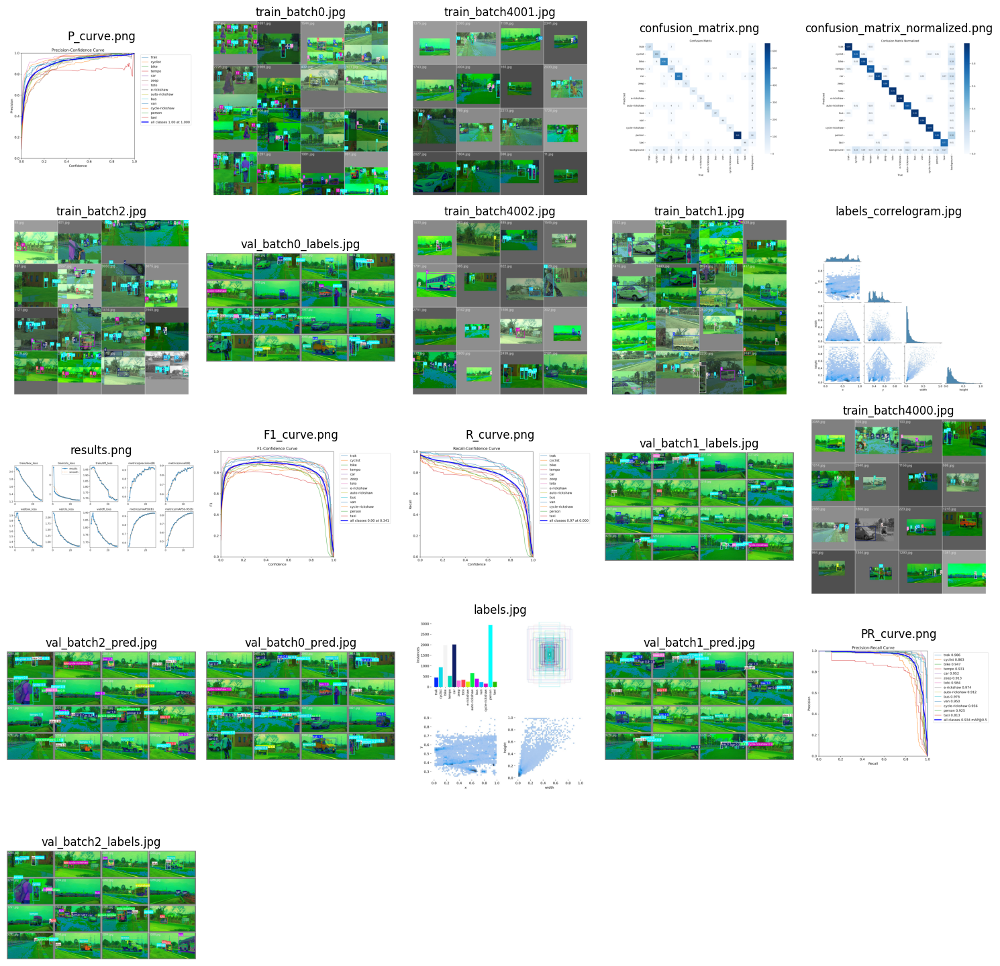

In [12]:
import os
import random
import cv2
import numpy as np
import torch
from IPython.display import display
import matplotlib.pyplot as plt
from pathlib import Path

def display_images_from_folder(folder_path):
    """
    Finds and displays all .jpg, .png, and .jpeg images from a specified folder.
    """
    # Supported image extensions
    valid_extensions = ('.jpg', '.jpeg', '.png')
    
    # List to store images
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

    if not image_files:
        print("No valid images found in the specified folder.")
        return

    # Plotting images
    plt.figure(figsize=(15, 15))
    for i, image_file in enumerate(image_files):
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        plt.subplot(5, 5, i+1)  # Adjust the grid size (5, 5) as needed
        plt.imshow(image_rgb)
        plt.title(image_file)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
display_images_from_folder("/kaggle/working/ultralytics/runs/detect/train")

In [13]:
# Run inference on an image with YOLOv8n
!yolo predict model="/kaggle/working/ultralytics/runs/detect/train/weights/best.pt" \
source="/kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images"

Ultralytics 8.3.102 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv10s summary (fused): 129 layers, 8,045,796 parameters, 0 gradients, 24.5 GFLOPs

image 1/800 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3201.jpg: 384x640 1 bike, 55.1ms
image 2/800 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3202.jpg: 384x640 1 cyclist, 1 car, 1 person, 10.9ms
image 3/800 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3203.jpg: 384x640 1 bike, 2 cars, 3 auto-rickshaws, 3 persons, 1 taxi, 10.6ms
image 4/800 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3204.jpg: 384x640 2 bikes, 1 zeep, 10.5ms
image 5/800 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3205.jpg: 384x640 1 bike, 10.6ms
image 6/800 /kaggle/input/iruvd-dataset-for-automatic-vehicle-detection/JU_yolov5/valid/images/3206.jpg: 

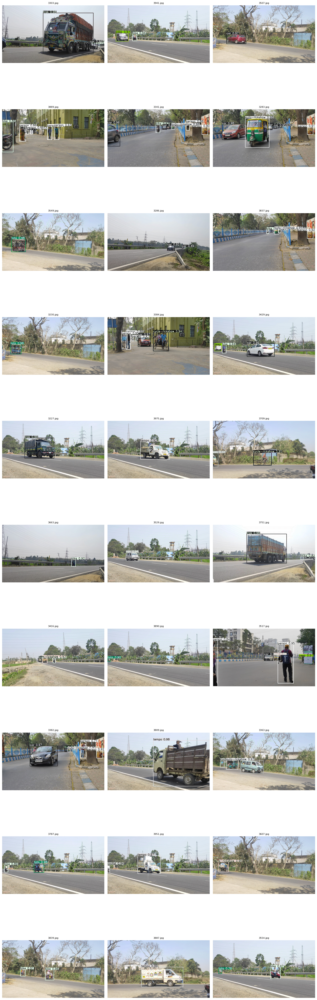

In [14]:
import os
import random
import cv2
import numpy as np
import torch
from IPython.display import display
import matplotlib.pyplot as plt
from pathlib import Path
def display_random_images_from_folder(folder_path, num_images=30):
    """
    Finds and displays a random selection of .jpg, .png, and .jpeg images from a specified folder.
    """
    # Supported image extensions
    valid_extensions = ('.jpg', '.jpeg', '.png')
    
    # List all valid images
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(valid_extensions)]

    if not image_files:
        print("No valid images found in the specified folder.")
        return

    # Randomly select images (up to num_images)
    num_images = min(num_images, len(image_files))  # In case there are fewer than 30 images
    selected_images = random.sample(image_files, num_images)

    # Grid setup
    grid_rows = 10  # Adjust based on num_images
    grid_cols = 3
    plt.figure(figsize=(15, 5*grid_rows))  # Adjust figure size

    for i, image_file in enumerate(selected_images):
        image_path = os.path.join(folder_path, image_file)
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_HLS2RGB)
        
        plt.subplot(grid_rows, grid_cols, i + 1)
        plt.imshow(image_rgb)
        plt.title(image_file, fontsize=8)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage
display_random_images_from_folder("/kaggle/working/ultralytics/runs/detect/predict")